<center> <img src="https://d3i71xaburhd42.cloudfront.net/261c3e30bae8b8bdc83541ffa9331b52fcf015e6/3-Figure2-1.png" width=20% > </center>

# <center> Assignment 1: Photometric Stereo & Colour </center>
<center> Computer Vision 1 University of Amsterdam </center>
<center> Due 23:59PM, September 16, 2023 (Amsterdam time) </center>
<center> <b>TA's: Ozzy Ülger, Egoitz Gonzalez, Sina Taslimi</b></center>
    
***

Student1 ID: 15079015\
Student1 Name: Karim Abdel Sadek 

Student2 ID: 13136011 \
Student2 Name: Macha Meijer

Student3 ID: \
Student3 Name:

( Student4 ID: \
Student4 Name: )


# General guidelines


Your code and discussion must be handed in this jupyter notebook, renamed to **StudentID1_StudentID2_StudentID3.ipynb** before the deadline by submitting it to the Canvas Lab 1 Assignment. Please also fill out your names and ID's above.

For full credit, make sure your notebook follows these guidelines:
- It is mandatory to use the Python environment provided with the assignment; the environment specifies the package versions that have to be used to prevent the use of particular functions. Using different packages versions may lead to grade deduction. In the 'Environment Setup' below you can check whether your environment is set up correctly.
- To install the environment with the right package versions, use the following command in your terminal: ```python
conda env create --file=environment.yaml```, then activate the environment using the command ```python conda activate cv1```.
- Please express your thoughts concisely. The number of words does not necessarily correlate with how well you understand the concepts.
- Answer all given questions and sub-questions.
- Try to understand the problem as much as you can. When answering a question, give evidences (qualitative and/or quantitative results, references to papers, figures etc.) to support your arguments. Note that not everything might be explicitly asked for and you are expected to think about what might strengthen you arguments and make the notebook self-contained and complete.
- Tables and figures must be accompanied by a brief description. Do not forget to add a number, a title, and if applicable name and unit of variables in a table, name and unit of axes and legends in a figure.

__Note:__ A more complete overview of the lab requirements can be found in the Course Manual on Canvas

Late submissions are not allowed. Assignments that are submitted after the strict deadline will not be graded. In case of submission conflicts, TAs’ system clock is taken as reference. We strongly recommend submitting well in advance, to avoid last minute system failure issues.
Plagiarism note: Keep in mind that plagiarism (submitted materials which are not your work) is a serious crime and any misconduct shall be punished with the university regulations. This includes the use of generative tools such as ChatGPT.

**ENSURE THAT YOU SAVE ALL RESULTS / ANSWERS ON THE QUESTIONS (EVEN IF YOU RE-USE SOME CODE).**

# 0 Environment Setup

In [491]:
# environment and libraries
import os
import glob
import numpy as np
import random
import cv2
import matplotlib
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D   # necessary in part 4.

In [492]:
# Make sure you're using the provided environment!
assert cv2.__version__ == "3.4.8", "You're not using the provided Python environment!"
assert np.__version__ == "1.19.5", "You're not using the provided Python environment!"
assert matplotlib.__version__ == "3.3.4", "You're not using the provided Python environment!"
# Proceed to the next cell if you don't get any error.

# 1 Colour Spaces *(13 pts)*

In this part of the assignment, you will study the different colour spaces for image representations and experiment how to convert a given RGB image to a specific colour space

### 1.1 RGB Colour Model (2 pts)

Why do we use a RGB colour model as the basis of our digital cameras and photography? How does a standard digital camera capture the full RGB colour image?


The RGB model aligns with the trichromatic nature of the human eye. Oversimplifying, we have three kinds of cones: S-cones, M-cones, and L-cones, which are color-sensitive to blue, green, and red light. We can then mix the proper level of lights, to obtain a perception of a mixture of those colors (for example adding red and green light we may obtain yellow). In fact, there are two possible mixing models to obtain a gamut of colors. One is the additive model, while the other is a subtractive model. We use the additive model, which functions by adding wavelengths on top of each other. The subtractive model is used for example for paint. Using the three primary colors of light, i.e. Red, Green, and Blue we allow a production of a large number of colors, depending on the intensities. This model is particularly suitable for devices that emit light.

A digital camera is composed of different components, such as a sensor(CCD or CMOS), and a Color Filter Array (CFA). This filter separates the light into the three primary colors. Note that our eye is more sensitive to green. Thus, the filters have a higher proportion of green to capture the sensitivity of humans to this color. After the separation of this lightwave, the various components hit the sensor of the camera. The sensor consists of millions of light-sensitive pixels that detect light and convert it into electronic signals, to then become a digital value. An algorithm is used to enter the missing color values for each pixel, using as a reference the neighboring ones. This allows for the formation of a smooth image. This process is called demosaicing, which generates a full RGB value for each pixel. This is how a standard digital camera captures the full RGB color image. We may then have, depending on the quality of the digital camera, various steps such as white balance, color correction, and similar processes to produce a higher-quality image. After this processing, the image is compressed and stored in the camera's memory card.


### 1.2 Colour Space Conversion *(8 pts)*





Create a function to convert an RGB image into the following colour spaces by using the template code you are provided ConvertColourSpace() below and other sub-functions. Visualize the new image and its channels separately in the same figure. That is, for example, in the case of HSV colour space, you need to visualize the converted HSV image, and its Hue, Saturation and Value channels separately (4 images, 1 figure).

__Grayscale__

Convert the RGB image into grayscale by using 3 different methods mentioned in
https://www.johndcook.com/blog/2009/08/24/algorithms-convert-color-grayscale/
In addition, check and report which method OpenCV uses for grayscale conversion, include it as well, and visualize all 4 in the same figure.

__Opponent Colour Space__

$\begin{pmatrix}
O_1 \\
O_2 \\
O_3
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R-G}{\sqrt{2}} \\
\frac{R+G-2B}{\sqrt{6}} \\
\frac{R+G+B}{\sqrt{3}}
\end{pmatrix}$

__Normalized RGB (rgb) Colour Space__

$\begin{pmatrix}
r \\
g \\
b
\end{pmatrix}$ = $\begin{pmatrix}
\frac{R}{R+G+B} \\
\frac{G}{R+G+B} \\
\frac{B}{R+G+B}
\end{pmatrix}$

__HSV Colour Space__

Convert the RGB image into HSV Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2HSV)*.

__YCbCr Colour Space__

Convert the RGB image into YCbCr Colour Space. Use OpenCV’s built-in function *cv2.cvtColor(img, cv2.RGB2YCrCb)*. Note, you need to arrange the channels in $Y, C_b$ and $C_r$ order.

__HINT 1__

Ensure you understand the datatypes and ranges that the python conversion and image displaying functions require. This usually is [0, 1] for float datatype or [0, 255] for integer datatype. You may have to explicitely change the datatype.

__HINT 2__

Think about how to visualise for instance H, S, V channels. Do this in a manner that is meaningful, e.g. visualize each of the H, S, V channels in a RGB manner.  

In [493]:
awb_img = cv2.imread("./images/awb/awb.jpg")
awb_img = cv2.cvtColor(awb_img, cv2.COLOR_BGR2RGB)

We always put an image in RGB before proceeding with using it

In [494]:
def rgb2grays(input_image, method='opencv'):
    # converts an RGB into grayscale by using 4 different methods
    # YOUR CODE HERE
    input_image = input_image.astype(np.float32)/255.0

    # lightness method
    if method == 'lightness':
        new_image = input_image.copy()
        new_image[:] = np.max(new_image,axis=-1,keepdims=1)/2+np.min(new_image,axis=-1,keepdims=1)/2
    
    
    # average method
    elif method == 'average':
        new_image= input_image
        new_image[:] = input_image.mean(axis=-1,keepdims=1)

    # luminosity method
    elif method == 'luminosity':
        new_image = input_image
        W = [0.21,0.72,0.07] # weights
        W_mean = np.tensordot(new_image,W, axes=((-1,-1)))[...,None]
        new_image[:] = W_mean.astype(new_image.dtype) 

    # built-in opencv function
    elif method == 'opencv':
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2GRAY)
    else:
        raise ValueError("Method is invalid")

    return new_image


def rgb2opponent(input_image):
    # converts an RGB image into opponent colour space
    input_image = input_image.astype(np.float32)/255.0
    R = input_image[:,:,0]
    G = input_image[:,:,1]
    B = input_image[:,:,2]
    O1 = (R - G) / np.sqrt(2)
    O2 = (R + G - 2 * B) / np.sqrt(6)
    O3 = (R + G + B) / np.sqrt(3)
    O1 = ((np.sqrt(2) / 2) * O1) + 0.5 
    O2 = (np.sqrt(6) / 4 * O2) + 0.5
    O3 *= np.sqrt(3) / 3 #This 3 last passage is to normalize the channels again after manipulation
    new_image = np.dstack((O1, O2, O3))

    return new_image

def rgb2normedrgb(input_image):
    # converts an RGB image into normalized RGB colour space
    input_image = input_image.astype(np.float32)/255.0
    R = input_image[:,:,0]
    G = input_image[:,:,1]
    B = input_image[:,:,2]
    tot = R + G + B
    r = np.divide(R, tot, out=np.zeros_like(R), where=tot!=0)
    g = np.divide(G, tot, out=np.zeros_like(G), where=tot!=0)
    b = np.divide(B, tot, out=np.zeros_like(B), where=tot!=0)
    new_image = np.dstack((r, g, b))

    return new_image

In [495]:
from matplotlib.colors import LinearSegmentedColormap
def visualize(input_image, new_image, colourspace='rgb'):
    '''
     Visualize the new image and its channels separately in the same figure.
     That is, for example, in the case of HSV colour space, you need to
     visualize the converted HSV image, and its Hue, Saturation and Value
     channels separately (4 images, 1 figure).
    '''

    plt.figure(figsize=(10, 10))
    channels = {
        'rgb': ['Red', 'Green', 'Blue'],
        'hsv': ['Hue', 'Saturation', 'Value'],
        'ycbcr': ['Y', 'Cb', 'Cr'],
        'opponent': ['O1', 'O2', 'O3'],
        'normedrgb': ['r', 'g', 'b']
    }

    if colourspace == 'grayscale':
        grayscale_images = rgb2grays(input_image,method='opencv')
        methods = ['luminosity', 'average', 'lightness', 'opencv']
        for i, (method_name) in enumerate((methods)):
            if method_name == 'opencv':
                new_im = rgb2grays(input_image, method=method_name)
                plt.subplot(2, 2, i+1)
                plt.imshow(new_im,cmap='gray')
                plt.title(method_name)
                plt.axis('off')
            else:
                new_im = rgb2grays(input_image, method=method_name)
                plt.subplot(2, 2, i+1)
                plt.imshow(new_im)
                plt.title(method_name)
                plt.axis('off')
    
    elif colourspace == 'hsv':
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('New Image Converted')
        plt.axis('off')
        for i in range(3):
            if i == 0:
                plt.subplot(2, 2, i+2)
                h_channel = new_image[:, :, 0]
                s_channel = np.full_like(h_channel, 255)
                v_channel = np.full_like(h_channel, 255)
                hsv_max_sv = cv2.merge([h_channel, s_channel, v_channel])
                hsv_max_sv = cv2.cvtColor(hsv_max_sv, cv2.COLOR_HSV2RGB)
                plt.imshow(hsv_max_sv)
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i == 1:
                plt.subplot(2, 2, i+2)
                s_channel = new_image[:, :, 1]
                h_channel = np.full_like(s_channel, 179)
                v_channel = np.full_like(s_channel, 255)
                hsv_max_sv = cv2.merge([h_channel, s_channel, v_channel])
                hsv_max_sv = cv2.cvtColor(hsv_max_sv, cv2.COLOR_HSV2RGB)
                plt.imshow(hsv_max_sv)
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i ==2:
                plt.subplot(2, 2, i+2)
                v_channel = new_image[:, :, 1]
                h_channel = np.full_like(s_channel, 179)
                s_channel = np.full_like(s_channel, 0)
                hsv_max_sv = cv2.merge([h_channel, s_channel, v_channel])
                hsv_max_sv = cv2.cvtColor(hsv_max_sv, cv2.COLOR_HSV2RGB)
                plt.imshow(hsv_max_sv,cmap='gray')
                plt.title(channels[colourspace][i])
                plt.axis('off')
    
    elif colourspace == 'rgb':
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('New Image Converted')
        plt.axis('off')
        for i in range(3):
            if i == 0:
                plt.subplot(2, 2, i+2)
                temp1 = new_image.copy()
                temp1[:,:,1] = 0
                temp1[:,:,2] = 0
                plt.imshow(temp1)
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i == 1:
                plt.subplot(2, 2, i+2)
                temp2 = new_image.copy()
                temp2[:,:,0] = 0
                temp2[:,:,2] = 0
                plt.imshow(temp2)
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i ==2:
                plt.subplot(2, 2, i+2)
                temp3 = new_image.copy()
                temp3[:,:,0] = 0
                temp3[:,:,1] = 0
                plt.imshow(temp3)
                plt.title(channels[colourspace][i])
                plt.axis('off')


    elif colourspace == 'ycbcr':
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('New Image Converted')
        plt.axis('off')
        
        y = new_image[:,:,0]
        cb = new_image[:,:,1]
        cr = new_image[:,:,2]
        cb_n = (cb-cb.min())/(cb.max()-cb.min())
        cr_n = (cr-cr.min())/(cr.max()-cr.min())

        cb_fin = np.dstack((np.full_like(cb_n,0.5),np.full_like(cb_n,0.5),cb_n))
        cr_fin = np.dstack((cr_n,np.full_like(cr_n,0.5),np.full_like(cr_n,0.5)))
        for i in range(3):
            if i == 0:
                plt.subplot(2, 2, i+2)
                plt.imshow(y,cmap='gray')
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i == 1:
                plt.subplot(2, 2, i+2)
                plt.imshow(cb_fin)
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i ==2:
                plt.subplot(2, 2, i+2)
                plt.imshow(cr_fin)
                plt.title(channels[colourspace][i])
                plt.axis('off')

    elif colourspace == 'opponent':
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('New Image Converted')
        plt.axis('off')
        for i in range(3):
            if i == 0:
                plt.subplot(2, 2, i+2)
                plt.imshow(new_image[:,:,0],cmap= LinearSegmentedColormap.from_list('green_to_red',[(0,1,0),(1,0,0)],N=256))
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i == 1:
                plt.subplot(2, 2, i+2)
                plt.imshow(new_image[:,:,1], cmap= LinearSegmentedColormap.from_list('blue_to_yellow',[(0,0,1),(1,1,0)],N=256))
                plt.title(channels[colourspace][i])
                plt.axis('off')
            if i ==2:
                plt.subplot(2, 2, i+2)
                plt.imshow(new_image[:,:,2],cmap='gray')
                plt.title(channels[colourspace][i])
                plt.axis('off')

    else:
        
        plt.subplot(2, 2, 1)
        plt.imshow(new_image)
        plt.title('New Image Converted')
        plt.axis('off')

        
        for i in range(3):
            plt.subplot(2, 2, i+2)
            plt.imshow(new_image[:, :, i])
            plt.title(channels[colourspace][i])
            plt.axis('off')


    plt.tight_layout()
    plt.show()



In [527]:
def ConvertColourSpace(input_image, colourspace):
    '''
    Converts an RGB image into a specified color space, visualizes the
    color channels and returns the image in its new color space.

    Colorspace options:
      opponent
      rgb -> for normalized RGB
      hsv
      ycbcr
      gray

    P.S: Do not forget the visualization part!
    '''

    # Convert the image into double precision for conversions
    input_image = input_image.astype(np.float32)

    if colourspace.lower() == 'opponent':
        # fill in the rgb2opponent function
        new_image = rgb2opponent(input_image)

    elif colourspace.lower() == 'rgb':
        # fill in the rgb2normedrgb function
        new_image = rgb2normedrgb(input_image)

    elif colourspace.lower() == 'hsv':
        # use built-in function from opencv
        input_image = input_image.astype(np.uint8)
        new_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2HSV)
        #print(new_image.shape)

    elif colourspace.lower() == 'ycbcr':
        # use built-in function from opencv
        input_image = input_image.astype(np.float32) / 255.0
        temp_image = cv2.cvtColor(input_image, cv2.COLOR_RGB2YCrCb)
        new_image = temp_image.copy()

# Swap the channels
        new_image[:,:,1], new_image[:,:,2] = temp_image[:,:,2], temp_image[:,:,1] 
        

    elif colourspace.lower() == 'grayscale':
        # fill in the rgb2grays function
        new_image = rgb2grays(input_image)

    else:
        print('Error: Unknown colorspace type [%s]...' % colourspace)
        new_image = input_image

    visualize(input_image, new_image, colourspace)
    #return new_image just commented it because otherwise I would have to many weights plotted, making the notebook ugly after running experiments
    return

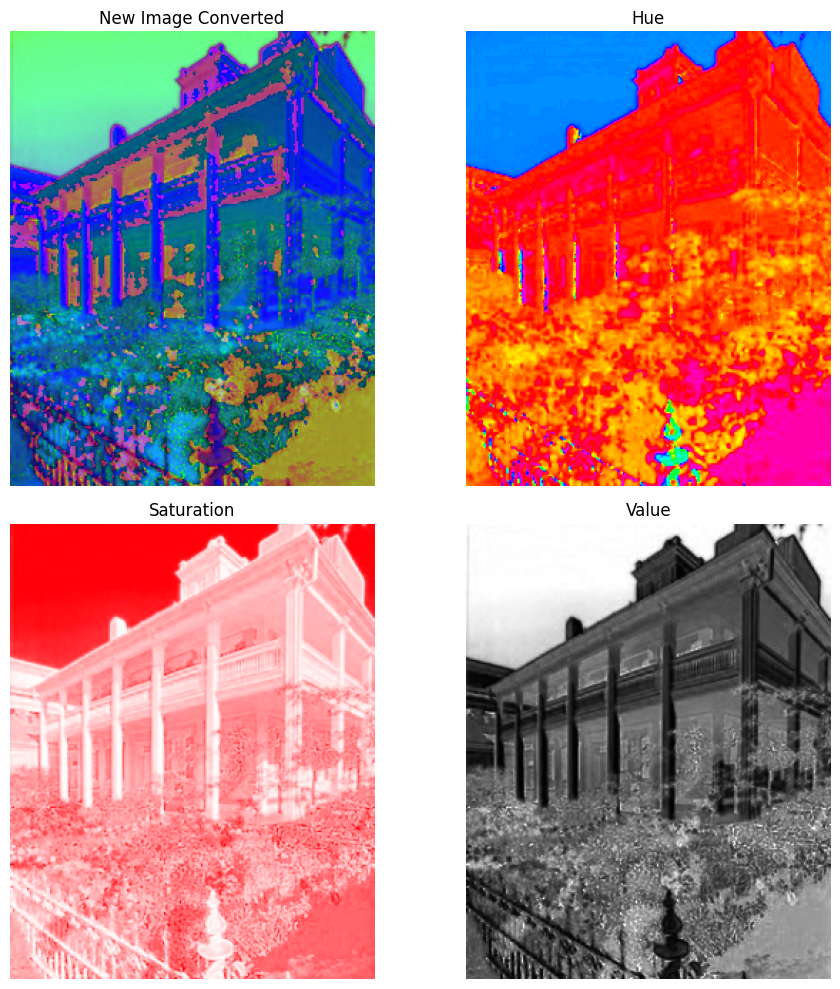

In [497]:
ConvertColourSpace(awb_img,'hsv')

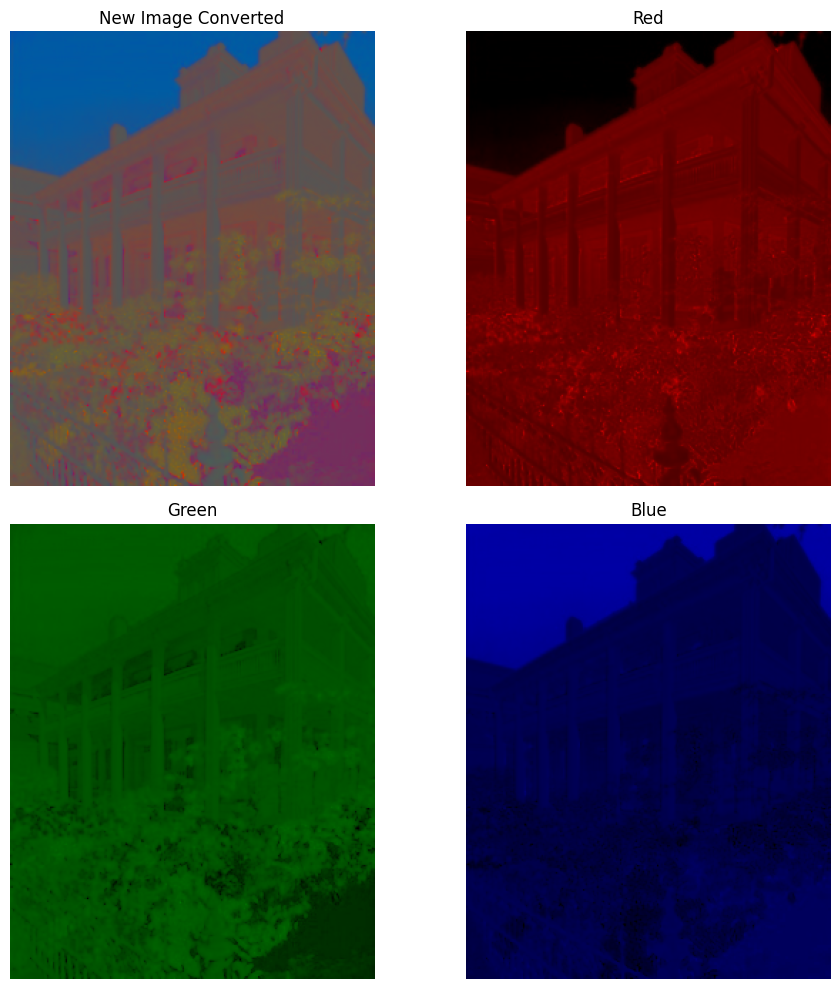

In [498]:
ConvertColourSpace(awb_img,'rgb')

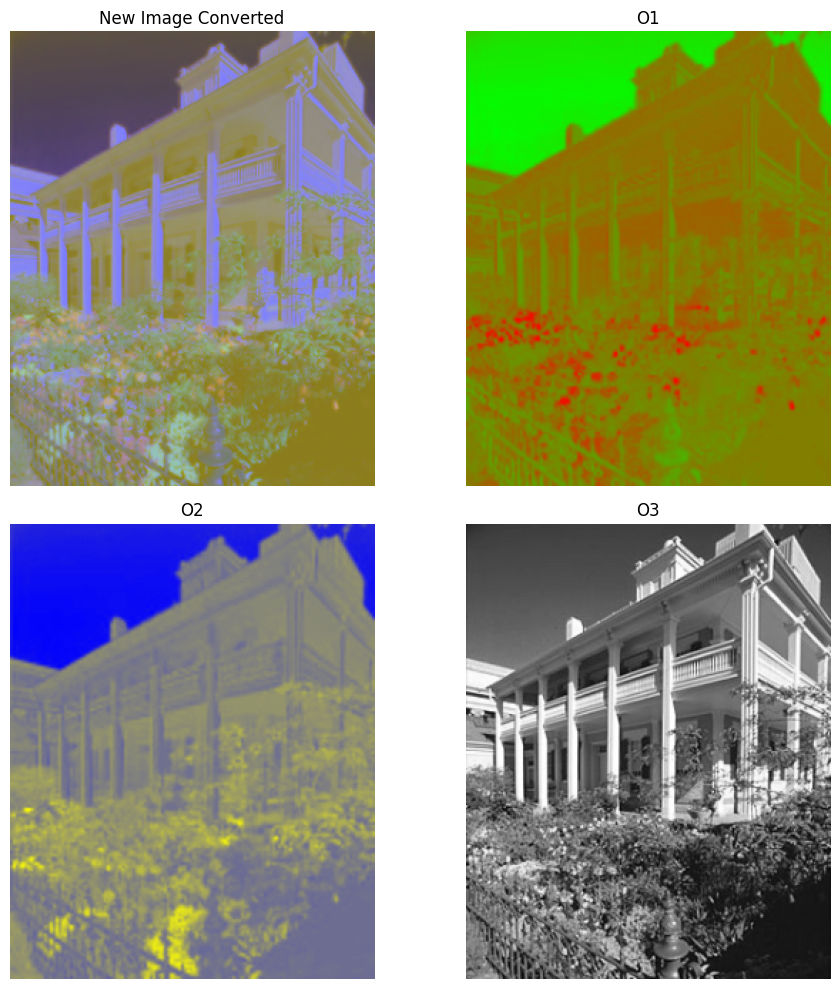

In [499]:
ConvertColourSpace(awb_img,'opponent')

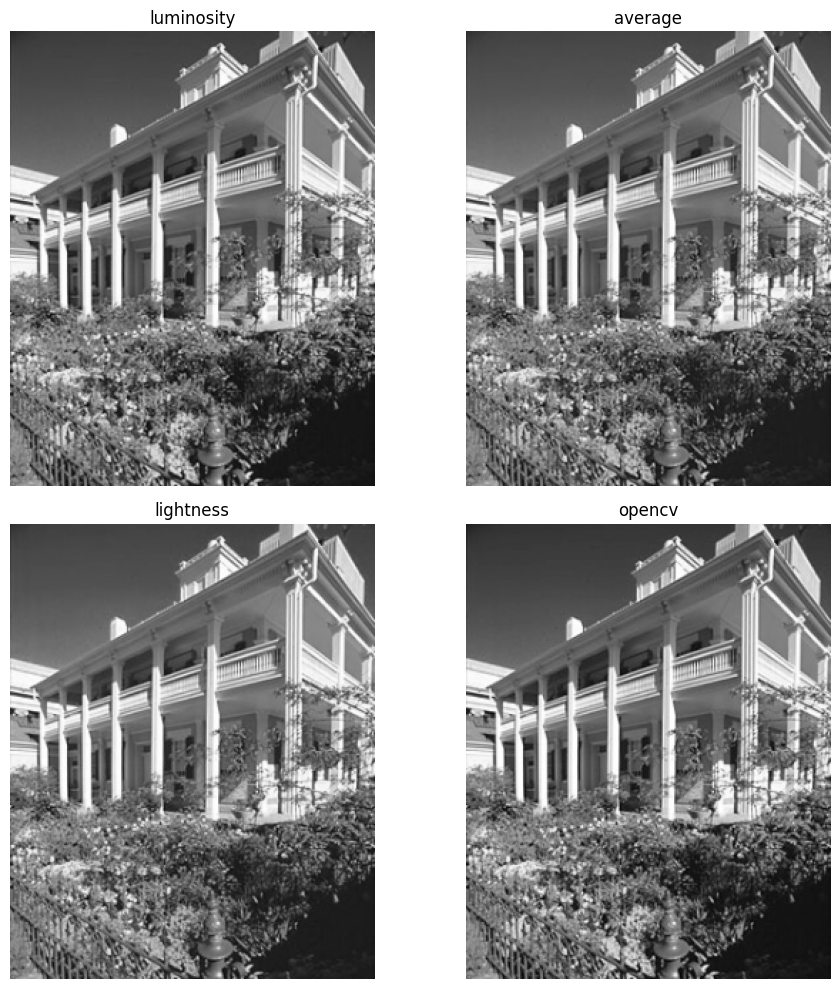

In [500]:
ConvertColourSpace(awb_img,'grayscale')

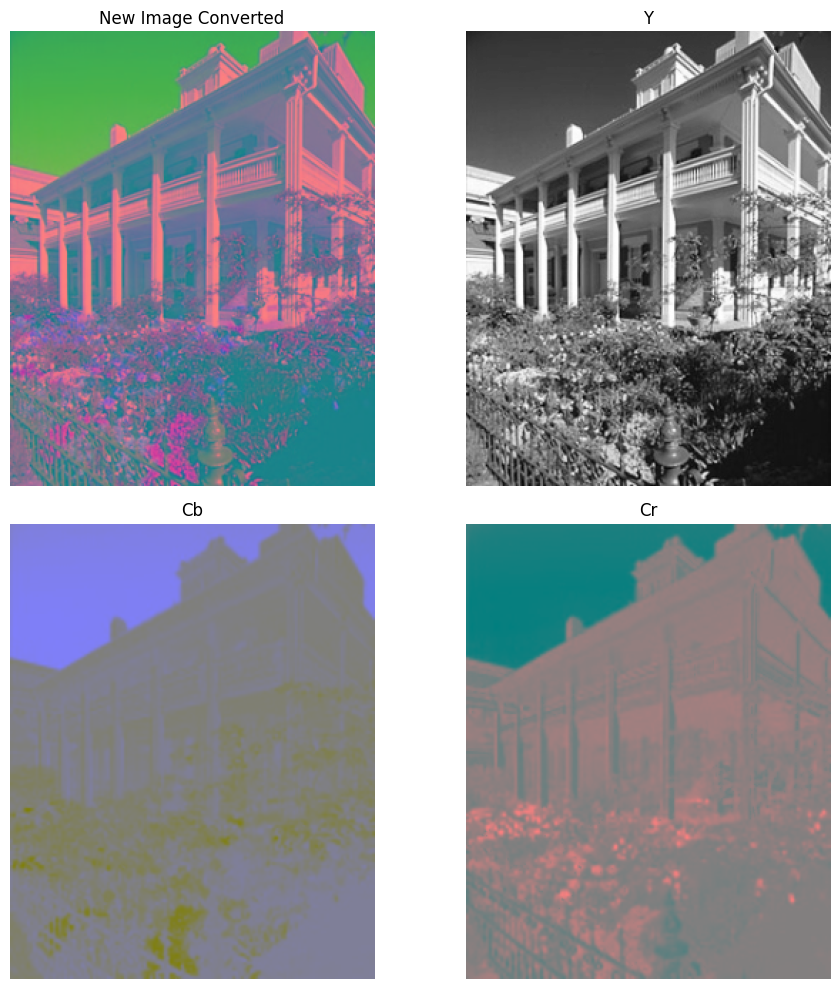

In [528]:
ConvertColourSpace(awb_img,'ycbcr')

### 1.3 Colour Space Properties (2 pts)

Explain each of the above 5 colour spaces and their properties. What are the benefits of using a different colour space other than RGB? Provide reasons for each of the above cases. You can include your observations from the visualizations.

Let's list,analyze and explain the 5 colour spaces obtained. 
#### 1.3.1. Opponent Color Space

The opponent color space theory derives from the belief that our visual system receives colors in an antagonistic way. Specifically, it suggests three opponents channels: red vs green, blue vs yellow, dark vs light. 
In fact, we can see that this is what we are actually implementing. 
1. O1: (R-G) is exactly the difference between the red and the green channel
2. O2: (R+G-2B)/2 is an approximate representation of the difference between blue and yellow(red+green indeed!).
3. O3: (R+G+B)/3 represents an approximation of luminosity. See that this is because we are using an additive model. An higher value means more luminosity! 

This is indeed what is happening if we see the results we obtained. We see that the image emphasizes constrast. This is particularly clear in O1 and O2, where differents parts of the image are highlighted. On the other hand, we can see that the emphasis of O3 is on the luminosity and the contrast between dark and light areas. Indeed, this color spaces finds applications in neuroscience research, or in predicting human vision.

#### 1.3.2. HSV
 Represents color in terms of tint (hue), shade (value), and the color intensity (saturation).
Channels:
Hue: Represents the color type. It's the aspect of color we notice first.
Saturation: Represents the vibrancy of the color. A fully saturated color would be pure, while a less saturated color would appear more washed-out or pale.
Value: Reflects the brightness or darkness of the color.
Benefits: More intuitive for humans to understand and interpret, especially when adjusting tints and shades. It's often used in graphics software and has applications in tasks like color-based segmentation in computer vision.
YCbCr:

The HSV colourspace has three components: Hue, Saturation and Value. The Hue parameter represents the color. Imagine a cone with the 6 primary colors ( Red, Yellow, Green, Cyan, Blue, Magenta). His value determines the angle we rotate and thus the color we choose. Considering 6 colors, it takes value between 0 and 360. However, in our case of RGB it just takes integer values in the range [0,179]. 
Saturation instead indicates the level of gray. A lower saturation means a more faded color. An high saturation level produces a more intense color. If the value is maximum (100 for example), we obtain the primary color. The Value indicates instead the brightness. A lower value means a darker color, and an high value produces a brighter color. The HSV results and its divisions in the channel we obtained are coherent with the explanation above. HSV finds applications in computer graphics, to produce high quality images. It can be useful when tuning the 3 parameters, especially when working on tints and shades.


#### 1.3.3. Normalized RGB
This color space normalizes the standard RGB values by the sum of the three channels to make it invariant with respect to the illumination. We simply divide each color component by the sum of the three channels. From the image we can see that we have an emphasis just on the color. This can indeed be useful and better when illumination conditions may vary.


#### 1.3.4. YCbCr

YCbCr decouples the color in three components: Luminance (Y), blue difference chroma component (Cb) and red difference chroma component (Cr).
The Luminance indicates the brightness. Cb and Cr represents the deviatiosn from grey along the blue and red axes respectively. An application is found in compression algorithms for images. Our human vision is more sensitive to luminance than to chrominance. Thus, we can reduce the resolution of the Cb and Cr channels without perceiving, at an eye luman level, a loss of quality in the image



#### 1.3.5. Grayscale
The Grayscale colour space represents images just in shades of gray. We thus only have one channel, representing the intensity of colors. We can see this clearly in our images produces. The Grayscale colorspace allows for faster computations by algorithms, and it can be useful on edge detection. 

### 1.4 More on Colour Spaces (1 pt)

Find one more colour space from the literature, briefly explain its properties and give a use case.

Another notable color space from the literature is the Lab (CIELAB) color space.

CIELAB is a color space defined by the International Commission on Illumination (CIE) in 1976. It's a non-linear transformation of RGB designed to be perceptually uniform. This means that a change of the same amount in a color value should produce roughly the same change in perceptual significance. It is formed by 3 channels, namely L, a, and b. The channel L represents the luminance component. A low corresponds to dark/black, and a high value corresponds to light/white. The 'a' component represents the green-red component, as it can assume negative values (green) and positive ones(red). Analogously, b represents the blue-yellow component. Note that this model is based on the opponent color model. In CIELAB we also have the concept of Perceptual Uniformity. In CIELAB distance between colors correlates with perceptual differences, and they are not dependent on the device they are visualized on. This can be useful in an industry context to quantify the difference between two colors. An example can be the quality control for matching colors when producing various items, such as paints or furniture pieces.

# 2 Colour Constancy *(15 pts)*

Colour constancy is the ability to perceive colors of objects, invariant to the colour of the light source. The aim for colour constancy algorithms is first to estimate the illuminant of the light source, and then correct the image so that the corrected image appears to be taken under a canonical (white) light source. The task of the automatic white balance (AWB) is to do the same in digital cameras so that the images taken by a digital camera look as natural as possible.

In this part of the assignment, you will implement the most famous colour constancy algorithm; *Grey-World Algorithm*. The algorithm assumes that, under a white light source, the average colour in a scene should be achromatic (grey, [128, 128, 128]).

Specific information on the algorithm can be found on:
https://en.wikipedia.org/wiki/Color_normalization#Grey_world



### 2.1 Grey-World algorithm (8 pts)

Complete the function to apply colour correction to an RGB image by using Grey-World algorithm. Display the original image and the colour corrected one on the same figure. Use awb.jpg image (provided in the downloaded zip-file) to test your algorithm. In the end, you should see that the reddish colour cast on the image is removed and it looks more natural.

  ***Note:*** You do not need to apply any pre or post processing steps. For the calculation or processing, you are not allowed to use any available code or any dedicated library function except *standard Numpy functions*.
   

In [502]:
def grey_world(awb_img):
    
    #awb_img = awb_img.astype(np.float32) / 255.0

    r_mean = np.mean(awb_img[:,:,0])
    g_mean = np.mean(awb_img[:,:,1])
    b_mean = np.mean(awb_img[:,:,2])

    
    scaling_factors = 128 / np.array([r_mean, g_mean, b_mean])
    colorCorrectedImg = awb_img * scaling_factors
    
    
   
    colorCorrectedImg = np.clip(colorCorrectedImg, 0, 255).astype(np.uint8)


    plt.figure(figsize=(10,5))
    plt.subplot(1, 2, 1)
    plt.imshow(awb_img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(colorCorrectedImg)
    plt.title("Grey-World Corrected Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


    return colorCorrectedImg

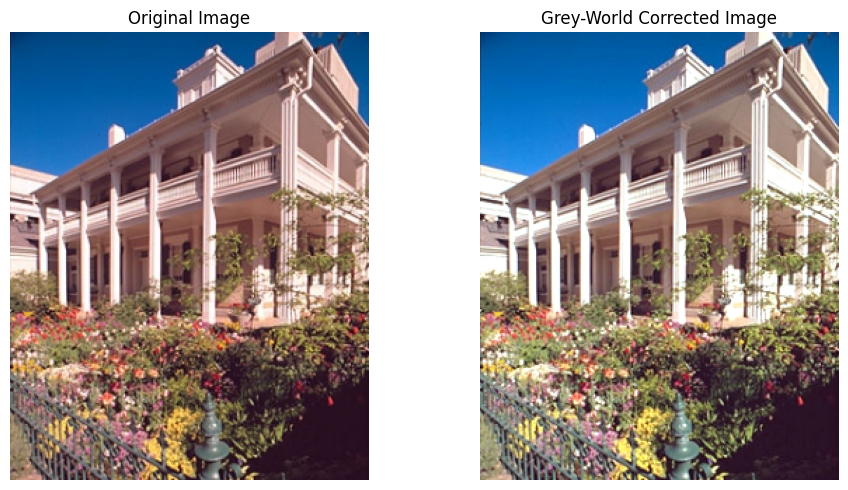

In [503]:
corrected_img = grey_world(awb_img)

### 2.2 Limits of Grey-World (2 pts)

Give an example case for Grey-World Algorithm on where it might fail. Include your reasoning.


The Grey-World algorithm is based on the assumption that the average reflectance of objects in a scene is  (gray). However, this assumption doesn't hold for all images we may obtain. 
Specifically, the Grey-World algorithm can fail when an image presents one large region with just a uniform color. An example came to my mind when I saw some pictures of tulips here around the Netherlands! 

Imagine taking a picture of a large field of bright red tulips. Consider this photo taken during the day. Imagine the image as containing just the field, except a tiny portion of the sky in the background. The same can apply to a vast green field, with a small stripe of brown dirt at the bottom for example. By how the Grey-World algorithm works, it will consider the red in this scene as caused by the illuminance of the light and not by the nature of the objects depicted themselves. The dominant color in this scene contributes to the shifted average color, producing suboptimal results. In this example, it may make the tulips appear unnaturally pink or slightly grey. Besides this, the background sky may be rendered with a color very far from its natural one. 

To recap, GreyWorld may then fail when our image is biased towards a color by nature, and not by illumination or similar. In this example, the fact that neutral grey is the average color does not hold, and thus it will make the algorithm fail.

### 2.3 Other Constancy algorithms (5 pts)

Find out one more colour constancy algorithm from the literature and explain it briefly.


Another color constancy algorithm is presented in Edge-Based Color Constancy (van de Weijer, J. and Gevers, T. and Gijsenij, A.")(2007). 
 In this algorithm the assumption is more refined: is the average edge difference in a scene that is achromatic, i.e. grey. Simplifying, the algorithm works by first identifying the edges in the image. Following this, the difference in chromaticity is computed. At the end, the estimate for the illumination is computed, for examples taking the mode or a fancy weighted average of the differences in chromaticity. As it can appear clear, this algorithm may fail when edges in an image are not well defined. However, by construction, it is less sensitive to local shadows

# 3 Intrinsic Image Decomposition *(12 pts)*


Intrinsic image decomposition is the process of separating an image into its formation components, such as reflectance (albedo) and shading (illumination). <a name="cite_ref-1"></a>[<sup>[1]</sup>](#cite_note-1) Then, under the assumptions of body (diffuse) reflection, linear sensor response and narrow band filters, the decomposition of the observed image $I(\vec{x})$ at position $\vec{x}$ can be approximated as the element-wise product of its albedo $R(\vec{x})$ and shading $S(\vec{x})$ intrinsics:

$$I(\vec{x})=R(\vec{x}) \times S(\vec{x})$$

In this part of the assignment, you will experiment with intrinsic image components to perform a particular computational photography applications: material recolouring. For the experiments, we will use images from a synthetic intrinsic image dataset. <a name="cite_ref-2"></a>[<sup>[2]</sup>](#cite_note-2)

<a name="cite_note-1"></a><small>1. [^](#cite_ref-1) H. G. Barrow and J. M. Tenenbaum. Recovering intrinsic scene characteristics from images. Computer Vision Systems, pages 3-26, 1978.</small>

<a name="cite_note-2"></a><small>2. [^](#cite_ref-1) http://www.cic.uab.cat/Datasets/synthetic_intrinsic_image_dataset/



### 3.1 Image decomposition *(2 pts)*

In what other components can an image be decomposed other than albedo and shading? Give an example and explain the concepts in your answer.

One example of Image decomposition is the RGB scale into three components, which we analyzed before. Reading and following the paper written above an image can also be decomposed in this additional components: Intensity, Orientation and Distance, beside Albedo and Shading mentioned above. Another possible decomposition of the image can be by  Distance and Intensity. Distance represents the distance in an image of each point from the camera capturing it. The Intensity represents just the inherent color information. This decomposition may be useful in smartphone cameras to determine which part of the image to blur (think about the Portrait mode on an iPhone!). 

### 3.2 Synthetic data *(2 pts)*

If you check the literature, you will see that almost all intrinsic image decomposition datasets are composed of synthetic images. What might be the reason for that?

We would say that this is mainly due to convenience. Generating images that have reflectance and shading placed conveniently is for sure easier than capturing real-world images with those same characteristics. Controlling the intrinsic properties of the images synthetically, i.e. producing a synthetic image, is certainly easier than producing real-world images with the same characteristics. This is particularly true when we want a broad range of scenarios with the different combinations and values of the parameters. This can assure a better performance when training models since we would obtain a broader pool of images on which we can train our model on. Moreover, synthetic images can be consistent and easily reproducible for experiments for example. Time and money can also be a factor, since setting real-life experiments to produce this dataset can be very expensive, time-wise and money-wise. Given the advantages of synthetic images, we should also consider that our model may not perform well on real-world images if trained with a synthetic dataset.

### 3.3. Reconstructing *(4 pts)*

Pick a favorite object from the synthetic intrinsic image dataset and store it's original image, shading and reflectance in a new folder in *'./images'*, e.g. *./images/intrinsic_images/* (or choose your own folder and change the path in the code). Show that you can actually reconstruct the original PNG image from its intrinsics using the albedo and shading. In the end, your script should output a figure displaying the original image, its intrinsic images and the reconstructed one. Complete the code for function **iid_image_formation()**.

The auxiliary functions are for opening and visualizing the original and intrinsic images. In your submission, only supply the images of the object you picked.

In [504]:
def iid_image_formation(albedo_img, shading_img):

    albedo_normalized = albedo_img / 255.0
    shading_normalized = shading_img / 255.0
    
    idd_normalized = albedo_normalized * shading_normalized
    idd_normalized = np.clip(idd_normalized, 0, 1).astype(np.float32)
    
    #idd_img = (idd_normalized * 255).astype(np.uint8)
    #idd_img = np.clip(idd_img, 0, 255).astype(np.uint8)
    idd_img = idd_normalized

    return idd_img

In [505]:
## Replace the image name with a valid image
img_path = './images/instrinsic_images/'
object_name = 'truck'

## Read with opencv
picked_object = cv2.imread(img_path + object_name + '_dl.png')
picked_object = cv2.cvtColor(picked_object, cv2.COLOR_BGR2RGB)
if picked_object is None:
    print('no image found')
else:
    print(object_name + ':', picked_object.shape)

objectShading = cv2.imread(img_path + object_name + '_dl_shad.png')
objectShading = cv2.cvtColor(objectShading, cv2.COLOR_BGR2RGB)
if objectShading is None:
    print('no image found')
else:
    print('objectShading:', objectShading.shape)

objectAlbedo = cv2.imread(img_path + object_name + '_refl.png')
objectAlbedo= cv2.cvtColor(objectAlbedo, cv2.COLOR_BGR2RGB)
if objectAlbedo is None:
    print('no image found')
else:
    print('objectAlbedo:', objectAlbedo.shape)


picked_object_IDD = iid_image_formation(objectAlbedo, objectShading)



truck: (270, 480, 3)
objectShading: (270, 480, 3)
objectAlbedo: (270, 480, 3)


In [506]:
def visualize_rec(input_image, albedo_img, shading_img, idd_img):

    plt.figure(figsize=(12, 8))
    
    images = [input_image, albedo_img, shading_img, idd_img]
    titles = ['Original', 'Albedo', 'Shading', 'Reconstructed']
    
    for i, (title, img) in enumerate(zip(titles, images)):
        plt.subplot(2, 2, i+1)
        plt.imshow(img)
        plt.title(title)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

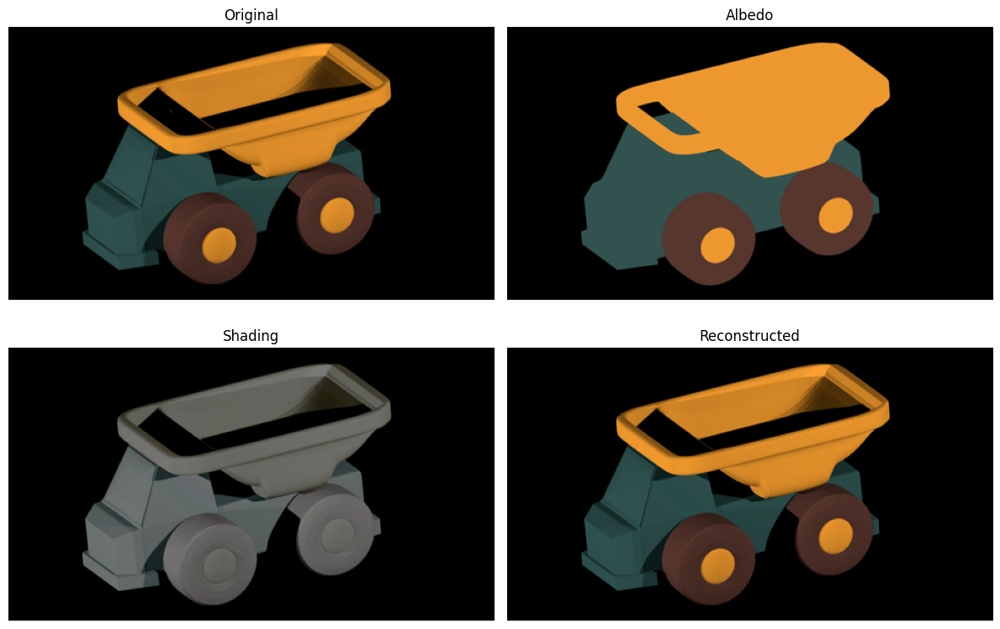

In [507]:

visualize_rec((picked_object/picked_object.max()*255.).astype(int), objectAlbedo, objectShading, (picked_object_IDD/picked_object_IDD.max()*255.).astype(int))

### 3.4 Recoloring *(4 pts)*


Manipulating colours in photographs is an important problem with many applications in computer vision. Since the aim for recolouring algorithms is just to manipulate colours, better results can be obtained for such a task if the albedo image is available as it is independent of confounding illumination effects.

Assume that you are given the PNG image and you have access to its
intrinsic albedo and shading images.
1. Find out the true material colour of the object you picked in RGB space (which is uniform in this case).
2. Recolour the object's image with pure green (0, 255, 0). Display the original object image and the recoloured version on the same figure. Complete the code for function **recolouring()**.

3. Although you have recoloured the object with pure green, the reconstructed images do not seem to display those pure colors and thus the colour distributions over the object do not appear uniform. Explain the reason.

In [508]:
def recolouring(albedo_img, shading_img):

    albedo_img = albedo_img.astype(np.float32) / 255.0
    shading_img = shading_img.astype(np.float32) / 255.0
    true_colour = np.mean(np.mean(albedo_img, axis=0), axis=0)

    
    pure_green = np.array([0, 1, 0])
    ratio = pure_green / (true_colour + 1e-10)
    
    
    recoloured_albedo = albedo_img * ratio
    

    recoloured_albedo = np.clip(recoloured_albedo, 0, 1).astype(np.float32)
  
    recoloured_image = recoloured_albedo * shading_img
    recoloured_image = (recoloured_image * 255).astype(np.uint8)
    recoloured_image = np.clip(recoloured_image, 0, 255).astype(np.uint8)


    return recoloured_image, recoloured_albedo

In [509]:
def visualize_recolor(original_img, recoloured_img, recoloured_albedo):
    plt.figure(figsize=(10, 5))
    

    plt.subplot(1, 3, 1)
    plt.imshow(original_img)
    plt.title('Original Image')
    plt.axis('off')
    
  
    plt.subplot(1, 3, 2)
    plt.imshow(recoloured_img)
    plt.title('Recoloured Image')
    plt.axis('off')

    plt.subplot(1, 3, 3)
    plt.imshow(recoloured_albedo)
    plt.title('Recoloured albedo')
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()

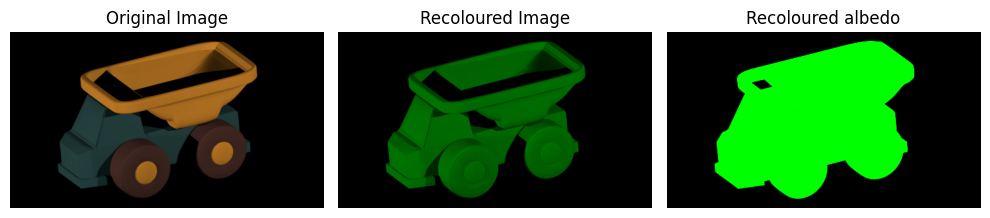

In [510]:
recoloured_image, recoloured_albedo = recolouring(objectAlbedo, objectShading)

visualize_recolor(picked_object, recoloured_image,recoloured_albedo)


If we go step by step, we can see why this happens. We set green as the unique color on the albedo image, giving the object a uniform color. We then combine this albedo recolored image with the shading image. Doing this, we introduce back variation in brightness and intensity, due to the lightness and other effects. Thus, the intrinsic color is pure green, but this illumination effect will create the variation that we can see in the experiment plotted above. To summarize, the final appearance is just a combination of the intrinsic color and their lighting effect, causing the phenomena we can observe.

__Note:__  this was a simple case where the image is synthetic, object centered and has only one colour, and you have access to its ground-truth intrinsic images. Real world scenarios require more than just replacing a single colour with another, not to mention the complexity of achieving a decent intrinsic image decomposition.

# 4 Photometric Stereo *(60 pts)*



In this part of the assignment, you are going to implement the photometric stereo algorithm as described in Section 5.4 (Forsyth and Ponce, *Computer Vision: A Modern Approach*). The chapter snippet has been included in the assignment zip file.

Following this instruction, you will edit and fill in your code in the procedures below **estimate_alb_nrm()**, **check_integrability()** and **construct_surface()**, that you can find in the codecells below (4.1, 4.2 and 4.3, respectively). The main script **photometric_stereo** (4.4) is provided for reference and should not be taken as is. Throughout the assignment, you will be asked to perform different trials and experiments which will require you to adjust the main code accordingly; this also shows how well you can cope with the materials.

Include images of the results into your notebook at informative points. For 3D models, make sure to choose a viewpoint that makes the structure as clear as possible and/or feel free to take them from multiple viewpoints.

### 4.1 Estimating Albedo and Surface Normal *(15 pts)*
Let us start with the grayscale sphere model, which is located in the SphereGray5 folder. The folder contains 5 images of a sphere with a grayscale checker texture under similar lighting conditions as the one in the book. Your task is to estimate the surface reflectance (albedo) and surface normal of this model. The light source directions are encoded in the image file names.

1. Complete the code for function **estimate_alb_nrm()** to estimate albedo and surface normal map for the SphereGray5 folder. What do you expect to see in albedo image and how is it different from your result?
2. In principle, what is the minimum number of images you need to estimate albedo and surface normal? Run the algorithm with more images by using SphereGray25, observe the differences in the results and report. You could try all images at once or a few at the time, in an incremental fashion. Choose a strategy and justify it by discussing your results.
3. What is the impact of shadows in photometric stereo? Explain the trick that is used in the text to deal with shadows. Remove that trick from your implementation and check your results. Is the trick necessary in the case of 5 images? how about 25 images?

An answer box can be found below the code cells.

**Hint**: To get the least-squares solution of a linear system, you can use **numpy.linalg.lstsq** function.

In [511]:
# Helper functions to load the synthetic images

def load_syn_images(image_dir='./images/photometrics_images/SphereGray5/', channel=0):
    files = os.listdir(image_dir)
    nfiles = len(files)

    image_stack = None
    V = 0
    Z = 0.5

    for i in range(nfiles):
        # read input image
        im = cv2.imread(os.path.join(image_dir, files[i]))
        im = np.flip(im, axis=-1)
        im = im[:,:,channel]

        # stack at third dimension
        if image_stack is None:
            h, w = im.shape
            print('Image size (H*W): %d*%d' %(h,w) )
            image_stack = np.zeros([h, w, nfiles], dtype=int)
            V = np.zeros([nfiles, 3], dtype=np.float64)

        image_stack[:,:,i] = im

        # read light direction from image name
        X = np.double(files[i][(files[i].find('_')+1):files[i].rfind('_')])
        Y = np.double(files[i][files[i].rfind('_')+1:files[i].rfind('.png')])
        V[i, :] = [-X, Y, Z]

    # normalization
    image_stack = np.double(image_stack)
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0
    normV = np.tile(np.sqrt(np.sum(V ** 2, axis=1, keepdims=True)), (1, V.shape[1]))
    scriptV = V / normV

    return image_stack, scriptV

In [512]:
## Helper function for showing results.

def show_results(albedo, normals, height_map=None, SE=None):
    # Stride in the plot, you may want to adjust it to different images
    stride = 1

    if albedo is not None:
        # showing albedo map
        fig = plt.figure()
        #albedo_max = albedo.max()
        albedo_max = 1
        albedo = albedo / albedo_max
        print(albedo.shape)
        plt.imshow(albedo, cmap="gray")
        plt.show()

    # showing normals as three separate channels
    figure = plt.figure()
    ax1 = figure.add_subplot(131)
    ax1.imshow(normals[..., 0])
    ax2 = figure.add_subplot(132)
    ax2.imshow(normals[..., 1])
    ax3 = figure.add_subplot(133)
    ax3.imshow(normals[..., 2])
    plt.show()

    # meshgrid
    X, Y, _ = np.meshgrid(np.arange(0,np.shape(normals)[0], stride),
    np.arange(0,np.shape(normals)[1], stride),
    np.arange(1))
    X = X[..., 0]
    Y = Y[..., 0]

    '''
    =============
    You could further inspect the shape of the objects and normal directions by using plt.quiver() function.
    =============
    '''

    if height_map is not None:
      # plotting model geometry
      H = height_map[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      plt.show()

    if SE is not None:
      # plotting the SE
      H = SE[::stride,::stride]
      fig = plt.figure()
      ax = fig.gca(projection='3d')
      ax.plot_surface(X,Y, H.T)
      plt.show()

In [513]:
def estimate_alb_nrm(image_stack, scriptV, shadow_trick=True):
#     '''
#     Compute the gradient of the surface
#     INPUT:
#         - image_stack : the images of the desired surface stacked up on the 3rd dimension
#         - scriptV : matrix V (in the algorithm) of source and camera information
#         - shadow_trick: (true/false) whether or not to use shadow trick in solving linear equations
#     OUTPUT:
#         - albedo : the surface albedo
#         - normal : the surface normal
#     '''

    h, w, _ = image_stack.shape

#     # create arrays for
#     # albedo (1 channel)
#     # normal (3 channels)
    albedo = np.zeros([h, w])
    normal = np.zeros([h, w, 3])

    # ================
    # YOUR CODE HERE
    #
    # for each point in the image array
    #     stack image values into a vector i
    #     construct the diagonal matrix scriptI
    #     solve scriptI * scriptV * g = scriptI * i to obtain g for this point
    #     albedo at this point is |g|
    #     normal at this point is g / |g|
    # ================
    for row_index, row in enumerate(image_stack):
        for column_index, element in enumerate(row):
            i = element.T
            if shadow_trick:
                scriptI = np.eye(i.shape[0]) * i
            else:
                scriptI = np.eye(i.shape[0])
            g = np.linalg.lstsq(scriptI @ scriptV, scriptI @ i, rcond=None)[0]
            norm = np.linalg.norm(g)
            albedo[row_index, column_index] = norm
            if norm != 0:
                normal[row_index, column_index, :] = g / norm
            else:
                normal[row_index, column_index, :] = np.NaN

    return albedo, normal

Result when using 5 images, shadow trick:
Image size (H*W): 512*512
(512, 512)


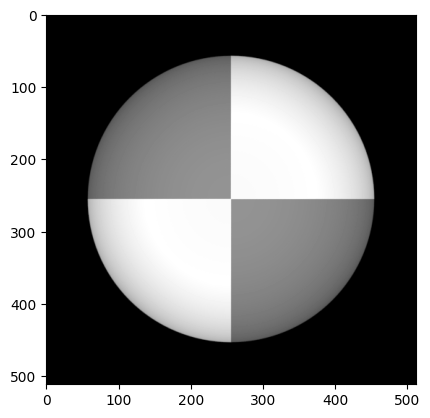

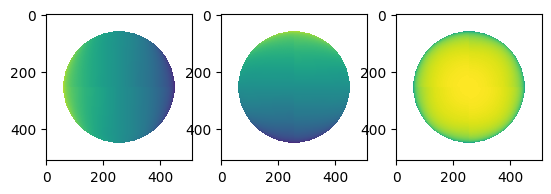

In [514]:
# load syn images
# YOUR CODE HERE
print("Result when using 5 images, shadow trick:")
image_stack, scriptV = load_syn_images(image_dir='./images/photometrics_images/SphereGray5/')
# estimate_alb_nrm
# YOUR CODE HERE)
albedo, normals = estimate_alb_nrm(image_stack, scriptV, shadow_trick=True)

# Show results
# YOUR CODE HERE
show_results(albedo, normals)

Result when using 5 images, no shadow trick:
Image size (H*W): 512*512
(512, 512)


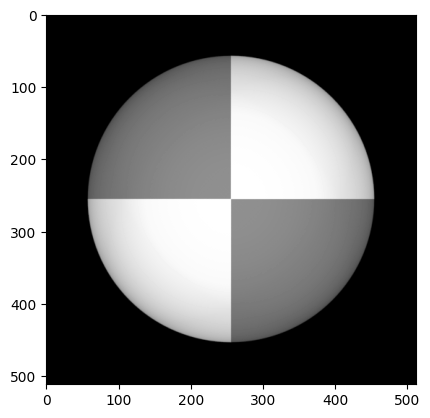

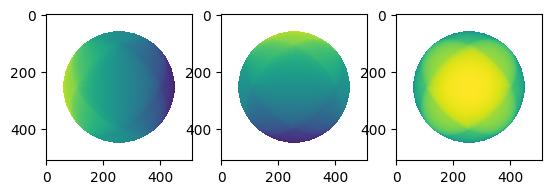

In [515]:
# load syn images
# YOUR CODE HERE
print("Result when using 5 images, no shadow trick:")
image_stack, scriptV = load_syn_images(image_dir='./images/photometrics_images/SphereGray5/')
# estimate_alb_nrm
# YOUR CODE HERE)
albedo_notrick, normals_notrick = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

# Show results
# YOUR CODE HERE
show_results(albedo_notrick, normals_notrick)

Result when using 25 images, shadow trick:
Image size (H*W): 512*512
(512, 512)


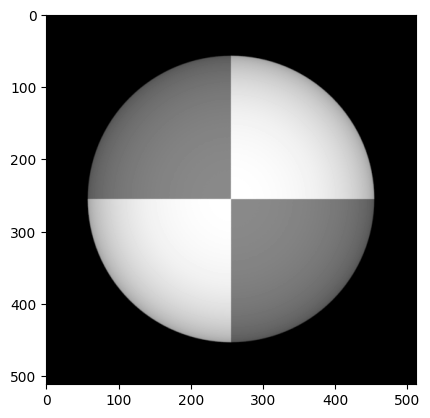

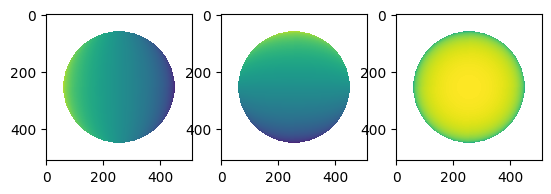

In [516]:
# load syn images
# YOUR CODE HERE
print("Result when using 25 images, shadow trick:")
image_stack, scriptV = load_syn_images(image_dir='./images/photometrics_images/SphereGray25/')
# estimate_alb_nrm
# YOUR CODE HERE)
albedo25, normals25 = estimate_alb_nrm(image_stack, scriptV, shadow_trick=True)

# Show results
# YOUR CODE HERE
show_results(albedo25, normals25)

Result when using 25 images, no shadow trick:
Image size (H*W): 512*512
(512, 512)


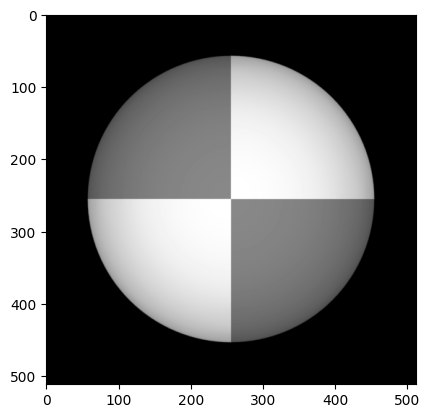

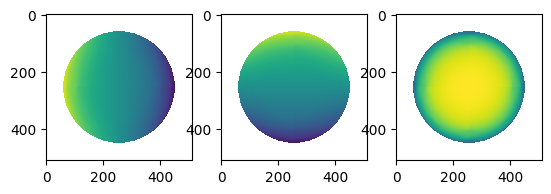

In [517]:
# load syn images
# YOUR CODE HERE
print("Result when using 25 images, no shadow trick:")
image_stack, scriptV = load_syn_images(image_dir='./images/photometrics_images/SphereGray25/')
# estimate_alb_nrm
# YOUR CODE HERE)
albedo25_notrick, normals25_notrick = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

# Show results
# YOUR CODE HERE
show_results(albedo25_notrick, normals25_notrick)


1. For the albedo image, one would expect to see an image without any shadows, so a circle with two white planes where the shade of white is the same everywhere in the plane, and with two gray planes where the shade of gray is the same everywhere in the plane. However, in the result, shadows are still visible at the edge of the circle.

2. The minimum number of images needed to estimate albedo and surface normal is five, because then you have one image from the top without shadow, and four images with shadows from different sides. For each shadowed image, you also want an image with a shadow at the exact opposite side so that the shadows cancel each other out. Also, you want at least a horizontal and a vertical shadow direction so that you have information about both directions. When incrementing the amount of images, we added four images each time, one kind of shadow from all four corners (for example (0.5, 0.5), (-0.5, -0.5), (0.5, -0.5) and (-0.5, 0.5)), because this way, you have the same amount added information for each part of the image. Per four images added, the albedo estimate became better.

3. Shadows cause difficulties for photometric stereo, especially for the normals, since they make certain parts of the image seem darker then they are. The shadows are different per image which causes noise for the normals, because they rely on the constant shadows. In the text, the matrix I is used to deal with shadows. The vector i contains all brightness observations per image, thus if there is a shadow in one of the images, the vector i will contain the value 0 for this image. By creating a diagonal matrix I of this vector, the images with shadows are taken out of the equation, since the matrix I will contain a row with zeros for these images. The trick is necessary in the case of 5 images because otherwise the normals will contain the shadows, as can be seen in the results above. In the case of 25 images, the trick is not necessary, because more information about how the shadows change is available. Therefore, there is no visible difference in the normals, as showed above.

### 4.2 Test of Integrability *(10 pts)*



Before we can reconstruct the surface height map, it is required to compute the partial derivatives $\frac{\delta f}{\delta x}$ and $\frac{\delta f}{\delta y}$ (or *p* and *q* in the algorithm). The partial derivatives also give us a chance to double check our computation, namely the test of *integrability*.

#### 4.2.1. Compute the partial derivatives (p and q in the algorithm) by filling in your code into **check_integrability()** (5 pts).

In [518]:
def check_integrability(normals):
    '''
    Check the surface gradient is acceptable
    INPUTS:
        - normals: normal image
    OUTPUTS:
        - p : df / dx
        - q : df / dy
        - SE : Squared Errors of the 2 second derivatives
    '''

    # initalization
    p = np.zeros(normals.shape[:2])
    q = np.zeros(normals.shape[:2])
    SE = np.zeros(normals.shape[:2])

    # ================
    # YOUR CODE HERE
    # ================
    # Compute p and q, where
    # p measures value of df / dx
    # q measures value of df / dy
    p = normals[:, :, 0] / normals[:, :, 2]
    q = normals[:, :, 1] / normals[:, :, 2]
    # change nan to 0
    p[p!=p] = 0
    q[q!=q] = 0

    # ================
    # YOUR CODE HERE
    # approximate second derivate by neighbor difference
    # and compute the Squared Errors SE of the 2 second derivatives SE
    # ================
    p_derivative = np.zeros((normals.shape[0], normals.shape[1]))
    q_derivative = np.zeros((normals.shape[0], normals.shape[1]))
    
    for i in range(1, normals.shape[0] - 1):
        for j in range(1, normals.shape[1] - 1):
            p_derivative[i, j] = (p[i-1, j] - p[i+1, j]) / 2
            q_derivative[i, j] = (q[i, j-1] - q[i, j+1]) / 2
        
    SE = (p_derivative - q_derivative)**2

    return p, q, SE

# Use the normals that you found in the previous question
p, q, SE = check_integrability(normals)
print('SE:', SE.shape, SE.max())

SE: (512, 512) 1.1575454400510206


#### 4.2.2. Second derivatives (5 pts)

Implement and compute the second derivatives according to the algorithm and perform the test of integrability by choosing a reasonable threshold. What could be the reasons for the errors? How does the test perform with different numbers of images used in the reconstruction process in 4.1?

A possible reason for the error could be the low number of images, which causes a less smooth gradient in the normals. When increasing the amount of images used, the error decreases from approximate 1.16 to 0.87. 

Another possible errors for the images include 

### 4.3 Shape by Integration *(15 pts)*  
To reconstruct the surface height map, we need to continuously integrate the partial derivatives over a path. However, as we are working with discrete structures, you will be simply summing their values.

The algorithm in the chapter presents a way to do the integration in column-major order, that is you start at the top-left corner and integrate along the first column, then go towards the right along each row. Yet, it is also noticed that it would be better to use many different paths and average so as to spread around the errors in the derivative estimates.

#### 4.3.1. Construct the surface height map (7 pts)

Construct the surface height map using column-major order as described in the algorithm, then implement row-major path integration. Your code should go in **construct_surface()**.

**Note**: By default, Numpy used row-major operations. So if you are unrolling an image to linearize the operation, you will end up with a row-major representation. Numpy can be configured to be column-major. Otherwise, if you are using the double for-loops without an unrolling operation, then this concern doesn’t apply.

**Hint**: You could further inspect the shape of the objects and normal directions by using **matplotlib.pyplot.quiver** function. You will have to choose appropriate sub-sampling ratios for proper illustration. You code goes to the **show_results()** function in the code cell above.

Path type = column:
p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


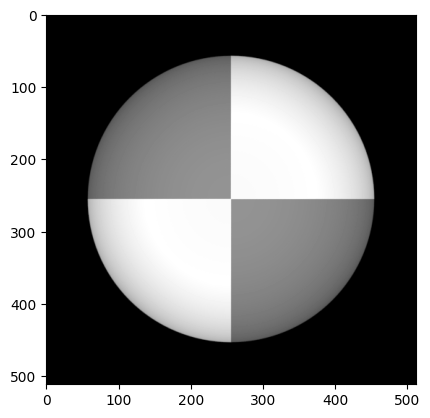

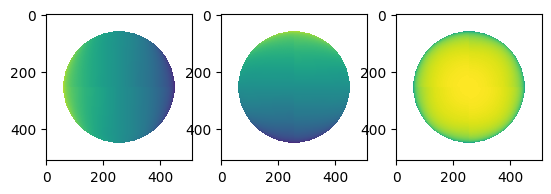

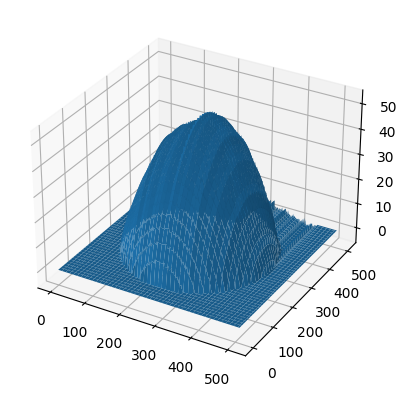

Path type = row:
p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


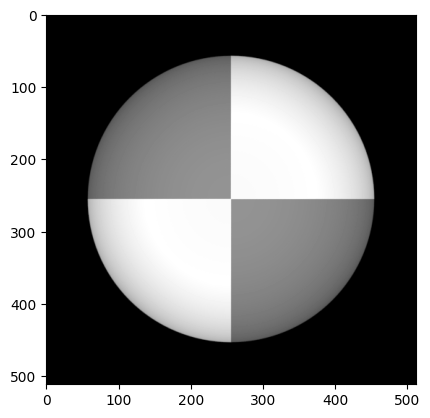

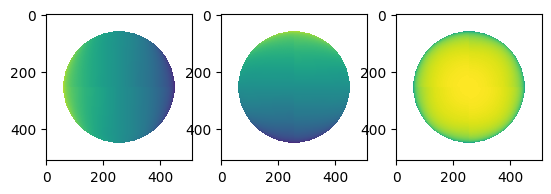

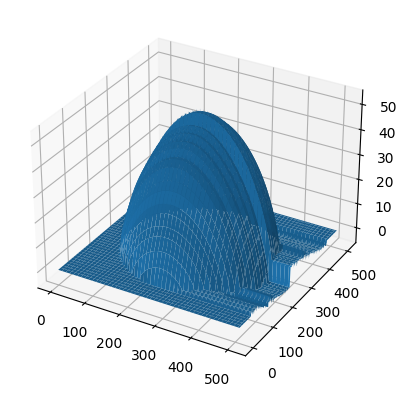

Path type = average:
p: (512, 512) q: (512, 512) 2.2500000000000004
(512, 512)


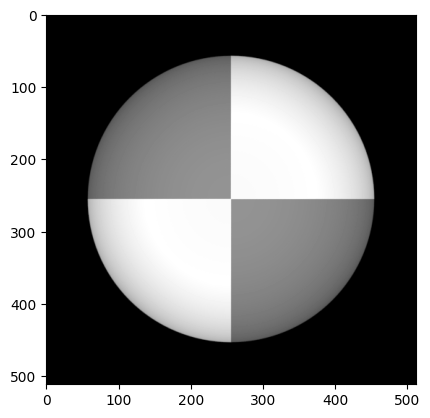

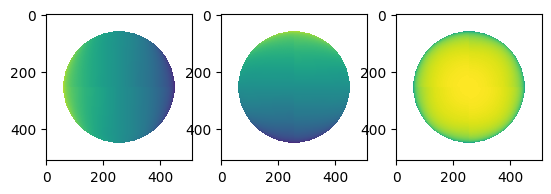

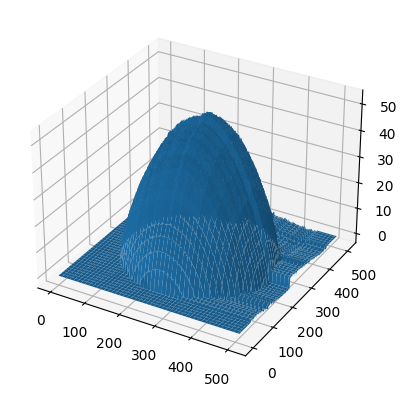

In [519]:
def construct_surface(p, q, path_type='column'):
    '''
    Construct the surface function represented as height_map
    INPUT:
       - p : measures value of df / dx
       - q : measures value of df / dy
       - path_type: type of path to construct height_map, either 'column',
         'row', or 'average'
    OUTPUT:
       - height_map: the reconstructed surface
    '''

    h, w = p.shape
    height_map = np.zeros([h, w])

    if path_type=='column':
        # ================
        # YOUR CODE HERE
        # ================
        # top left corner of height_map is zero
        # for each pixel in the left column of height_map
        #  height_value = previous_height_value + corresponding_q_value
        for i in range(1, h):
            height_map[i, 0] = height_map[i-1, 0] + q[i, 0]

        # for each row
        #   for each element of the row except for leftmost
        #       height_value = previous_height_value + corresponding_p_value
        for i in range(h):
            for j in range(w):
                if j != 0:
                    height_map[i, j] = height_map[i, j-1] + p[i, j]


    elif path_type=='row':
        # ================
        # YOUR CODE HERE
        # ================
        for j in range(1, w):
            height_map[0, j] = height_map[0, j-1] + p[0, j]
        
        for i in range(1, h):
            for j in range(w):
                height_map[i, j] = height_map[i-1, j] + q[i, j]

    elif path_type=='average':
        # ================
        # YOUR CODE HERE
        # ================
        height_map_column = construct_surface(p, q, path_type='column')
        height_map_row = construct_surface(p, q, path_type='row')
        height_map = (height_map_column + height_map_row) / 2

    return height_map

p, q, SE = check_integrability(normals)
print("Path type = column:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='column')

show_results(albedo, normals, height_map)

print("Path type = row:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='row')

show_results(albedo, normals, height_map)

print("Path type = average:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='average')

show_results(albedo, normals, height_map)

The results shown above are the results when using 5 images

Path type = column:
p: (512, 512) q: (512, 512) 1.7409550175959887
(512, 512)


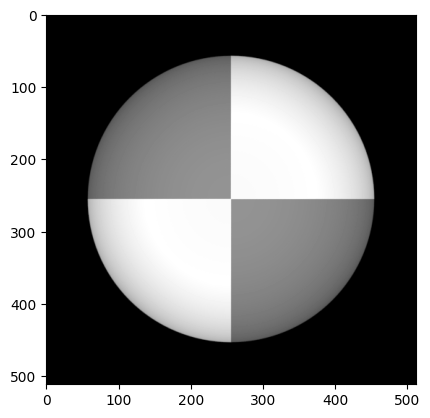

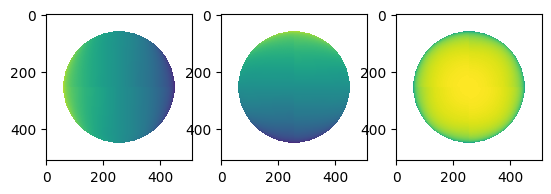

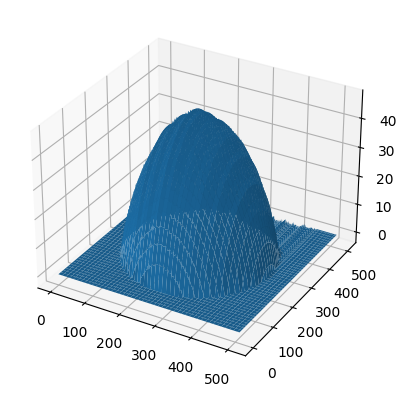

Path type = row:
p: (512, 512) q: (512, 512) 1.7409550175959887
(512, 512)


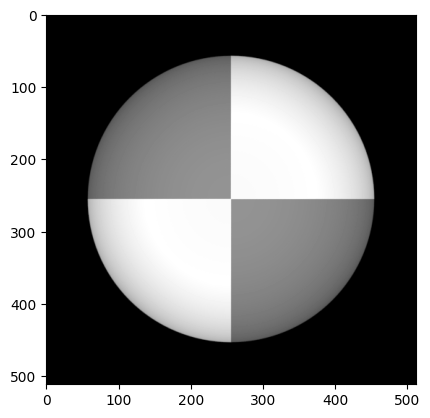

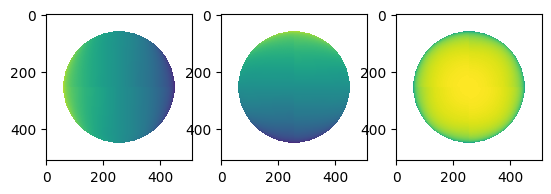

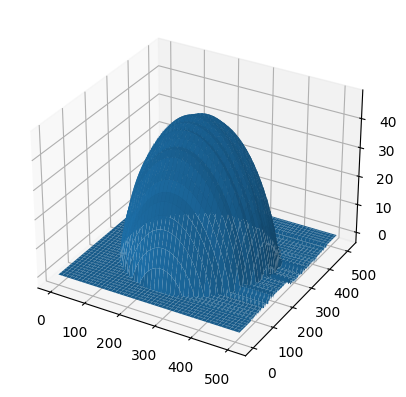

Path type = average:
p: (512, 512) q: (512, 512) 1.7409550175959887
(512, 512)


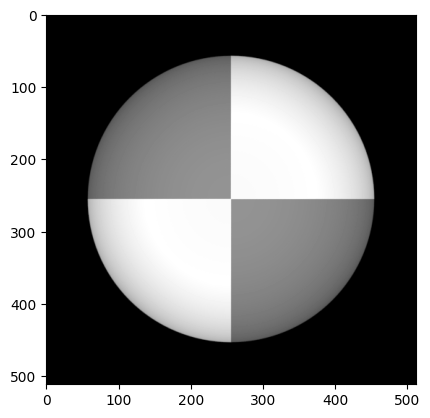

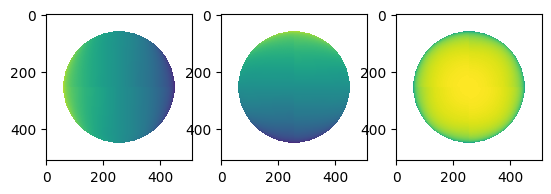

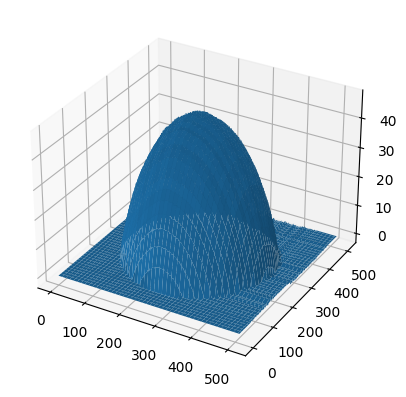

In [520]:
p, q, SE = check_integrability(normals25)
print("Path type = column:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='column')

show_results(albedo, normals, height_map)

print("Path type = row:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='row')

show_results(albedo, normals, height_map)

print("Path type = average:")
print('p:', p.shape, 'q:', q.shape, q.max())
height_map = construct_surface(p, q, path_type='average')

show_results(albedo, normals, height_map)

When using 25 images, these are the results.

#### 4.3.2. What are the differences in the results of the two paths? (4 pts)


When using the column path, there are some large differences in the x-direction. When using the row path, the large differences are in the y-direction.

#### 4.3.3. Now, take the average of the results. (4 pts)

Do you see any improvement compared to when using only one path? Are the construction results different with different numbers of images being used?

When taking the average, the height map is smoother in comparison to only using one path. When more images are used, the height map is smoother, but the observations for the path type differences stay the same.

### 4.4 Experiments with different objects *(20 pts)*
In this part, you will try to run the photometric stereo algorithm in a various number of scenarios to see how well it can be generalized.

#### 4.4.1. Run the algorithm and show the results for the MonkeyGray model. *(5 pts)*

##### 1.a Complete the code below, run the algorithm and show the results

Loading images...

Image size (H*W): 512*512
Finish loading 121 images.

Computing surface albedo and normal map...

Integrability checking

SE: (512, 512) 2.8065782443448515
Number of outliers: 1123

(512, 512)


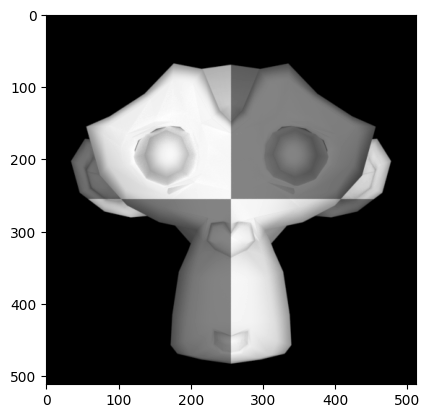

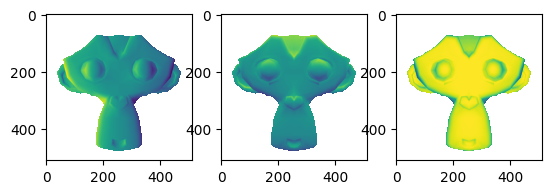

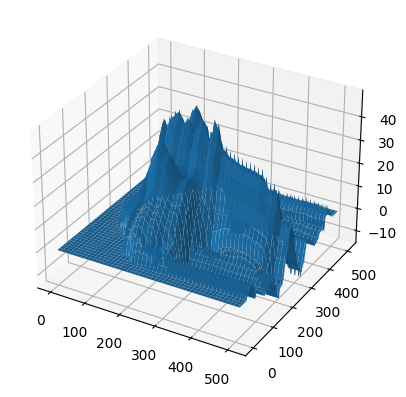

In [521]:
def photometric_stereo(image_dir='./images/photometrics_images/MonkeyGray/'):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack, scriptV] = load_syn_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo, normals = estimate_alb_nrm(image_stack, scriptV)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)
    print('SE:', SE.shape, SE.max())

    threshold = 0.1
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type='average')

    # show results
    # YOUR CODE HERE
    show_results(albedo, normals, height_map)

# Use the function
image_dir = 'images/photometrics_images/MonkeyGray/'
photometric_stereo(image_dir)

##### 1.b Explain errors

The albedo results of the monkey may comprise more albedo errors than in case of the sphere. Observe and describe the errors: Experiment with different cases and observe the errors that arise. (You don't need to calculate and give numerical errors.)

What could be the reason for those errors? You may want to experiment with different numbers of images as you did in Question 1 to see the effects.

Albedo errors still occur on parts of the monkey where there is a change in height. Since the height change is not gradually as in the sphere, slight shadows are still visible at these places, for example by the ears, eyes and arms. The reason for these errors could be that there is always a slight shadow because of the sudden height change, because of the distance from the light source to the object.

##### 1.c What do you think could help solving these errors?

A possible solution for these errors might be to move the light source closer to the object. This will likely make the shadows around the height changes smaller.

#### 4.4.2. Three-channel images. *(5 pts)*

So far, we have assumed that albedos are 1-channel grayscale images and that input images are also 1-channel. To work with 3-channel images, a simple solution is to split the input image into separate channels and treat them individually. Yet, that would generate a small problem while constructing the surface normal map if a pixel value in a channel is zero.


##### 2.a Update the implementation to work for 3-channel RGB inputs and test it with 2 models SphereColor and MonkeyColor.


Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

SE: (512, 512) 0.41334240565961383
Number of outliers: 425



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3)


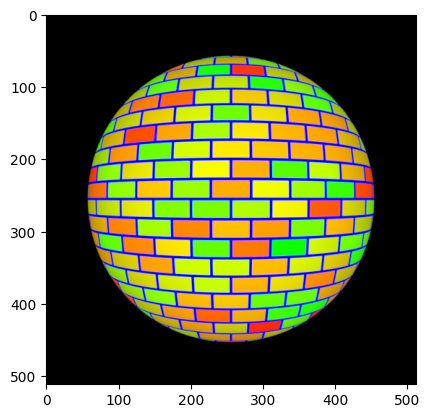

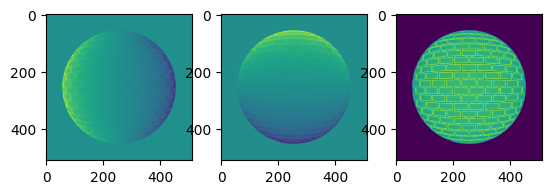

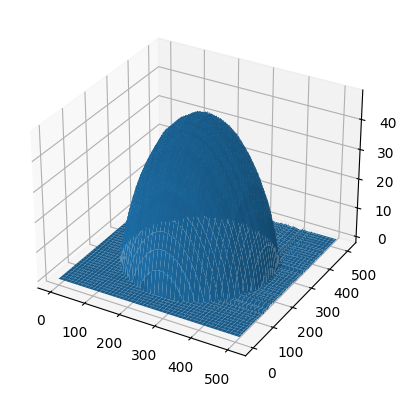

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Loading images...

Image size (H*W): 512*512
Finish loading 25 images.

Computing surface albedo and normal map...

Integrability checking

SE: (512, 512) 3.092831681703577
Number of outliers: 1122



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(512, 512, 3)


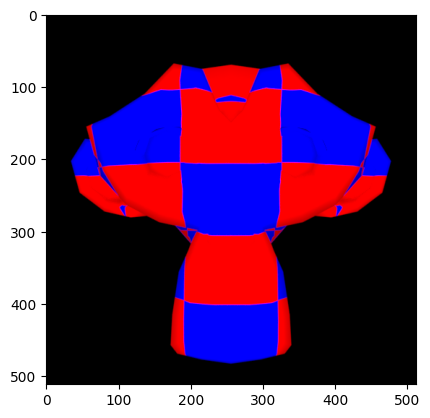

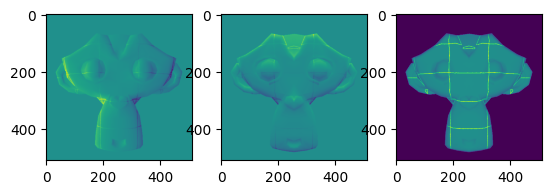

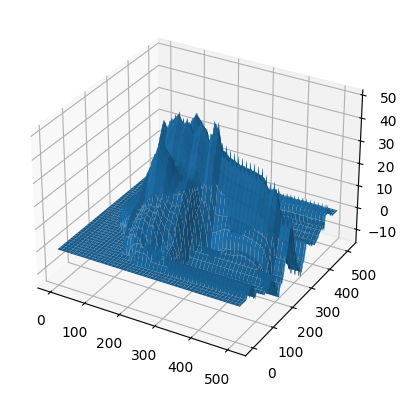

In [522]:
# YOUR CODE HERE
def photometric_stereo_color(image_dir='./images/photometrics_images/MonkeyGray/'):

    # obtain many images in a fixed view under different illumination
    print('Loading images...\n')
    [image_stack_r, scriptV_r] = load_syn_images(image_dir, channel=0)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Loading images...\n')
    
    [image_stack_g, scriptV_g] = load_syn_images(image_dir, channel=1)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    print('Loading images...\n')
    
    [image_stack_b, scriptV_b] = load_syn_images(image_dir, channel=2)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)

    # compute the surface gradient from the stack of imgs and light source mat
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo_r, normals_r = estimate_alb_nrm(image_stack_r, scriptV_r)
    albedo_g, normals_g = estimate_alb_nrm(image_stack_g, scriptV_g)
    albedo_b, normals_b = estimate_alb_nrm(image_stack_b, scriptV_b)
    albedo = np.dstack((albedo_r, albedo_g, albedo_b))
    normals_r[normals_r!=normals_r] = 0
    normals_g[normals_g!=normals_g] = 0
    normals_b[normals_b!=normals_b] = 0
    normals = (normals_r + normals_g + normals_b)/3
    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking\n')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)
    print('SE:', SE.shape, SE.max())

    threshold = 0.1
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # compute the surface height
    # YOUR CODE HERE
    height_map = construct_surface(p, q, path_type='average')

    # show results
    # YOUR CODE HERE
    show_results(albedo, normals, height_map)

# Use the function
image_dir = 'images/photometrics_images/SphereColor/'
photometric_stereo_color(image_dir)
image_dir = 'images/photometrics_images/MonkeyColor/'
photometric_stereo_color(image_dir)


##### 2.b Explain your changes and show your results.

To obtain the albedo of the colored image, we estimated the albedo for the red, green, and blue channel of the images, and combined these estimations per channel into one rgb image. To obtain the normals for the rgb image, an estimation of the normals per channel was made, and the mean of these estimations was taken.

##### 2.c Observe the problem in the constructed surface normal map and height map. Explain why a zero pixel could be a problem and propose a way to overcome that.

In the constructed surface normal map and height map can be seen that the lines between the 'bricks' are visible and are seen as height differences, because the pixel value is zero in 2 color channels. Because it is zero, the normal value is NaN, but for the calculations, the normal value is set to zero. If you then average over the normal value in color channels, the zero influences the average a lot. This is a problem because then it is seen as a height difference, while in practice, it is not. To overcome this problem, one could leave the color channel where the pixel is zero out of the averaging calculation for that pixel, so for every pixel averaging over the not-zero values only.


#### 4.4.3. Real world dataset A *(5 pts)*   

Now, it's the time to try the algorithm on real-world datasets. For that purpose, we are going the use the Yale Face Database and the Apple dataset.

First the Yale Face Database.

##### 3.a Run the algorithm for the Yale Face images: [Yale Face Database](http://cvc.cs.yale.edu/cvc/projects/yalefaces/yalefaces.html). The Yale face data is included in the lab material.

##### 3.b Observe and discuss the results for different integration paths.

An answer box can be found below the code cells.

**Hint**: For proper computation of albedo and surface normal, you may want to suspend the shadow trick described in the text, and use the original formula:
$$i = Vg(x,y)$$

In [523]:
## help functions for loading Yale Face and Apple images

def load_face_images(image_dir='./images/photometrics_images/yaleB02/'):
    num_images = 64
    filename = os.path.join(image_dir, 'yaleB02_P00_Ambient.pgm')
    ambient_image = cv2.imread(filename, -1)
    h, w = ambient_image.shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'yaleB02_P00A*.pgm'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        ang[0,j], ang[1,j] = np.double(filenames[j][12:16]), np.double(filenames[j][17:20])
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1) - ambient_image


    x = np.cos(np.pi*ang[1,:]/180) * np.cos(np.pi*ang[0,:]/180)
    y = np.cos(np.pi*ang[1,:]/180) * np.sin(np.pi*ang[0,:]/180)
    z = np.sin(np.pi*ang[1,:]/180)
    scriptV = np.array([y,z,x]).transpose(1,0)

    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV


def load_apple_images(image_dir='./images/photometrics_images/Apple', channel="0"):
    num_images = 99
    filename = os.path.join(image_dir, 'I_0002.png')
    try_image = cv2.imread(filename, -1)
    h, w = try_image[:,:,channel].shape

    # get list of all other image files
    import glob
    d = glob.glob(os.path.join(image_dir, 'I_00*.png'))
    import random
    d = random.sample(d, num_images)
    filenames = [os.path.basename(x) for x in d]
    filenames_idx = []
    for i in filenames:
        filenames_idx.append(int(i.split('_')[1].split('.')[0]))

    ang = np.zeros([2, num_images])
    image_stack = np.zeros([h, w, num_images])

    for j in range(num_images):
        image_stack[...,j] = cv2.imread(os.path.join(image_dir, filenames[j]), -1)[:,:,channel]

    with open('./images/photometrics_images/Apple/light_directions_refined.txt') as file:
        lines = [line.split() for line in file]
        x, y, z = [], [], []
        for idx in filenames_idx:
            x.append(float(lines[idx][0]))
            y.append(float(lines[idx][1]))
            z.append(float(lines[idx][2]))

    scriptV = np.array([y,z,x]).transpose(1,0)
    image_stack = np.double(image_stack)
    image_stack[image_stack<0] = 0
    min_val = np.min(image_stack)
    max_val = np.max(image_stack)
    image_stack = (image_stack - min_val) / (max_val - min_val) if max_val!=min_val else np.zeros(image_stack.shape)  # avoid fail when image_stack==0

    return image_stack, scriptV



In [524]:
'''
For each of Face and Apple, you should:
- Load the images
- Compute the surface albedo and normal map
- Run the integrability check
- Find the number of outliers
- Compute the surface albedo and normal mape surface height
- Show the results
'''

## Face
def photometric_stereo_face(image_dir='./images/photometrics_images/yaleB02/', path_type='average'):
    [image_stack, scriptV] = load_face_images(image_dir)
    [h, w, n] = image_stack.shape
    print('Finish loading %d images.\n' % n)
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo, normals = estimate_alb_nrm(image_stack, scriptV, shadow_trick=False)

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)
    print("Max SE error:", np.max(SE))

    # YOUR CODE HERE
    threshold = 0.01
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type=path_type)

    # show results
    show_results(albedo, normals, height_map)

## Apple
def photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type='average'):
    print('Loading images...\n')
    [image_stack_b, scriptV_b] = load_apple_images(image_dir, channel=0)
    [h, w, n] = image_stack_b.shape
    
    [image_stack_g, scriptV_g] = load_apple_images(image_dir, channel=1)
    [h, w, n] = image_stack_g.shape
    
    [image_stack_r, scriptV_r] = load_apple_images(image_dir, channel=2)
    [h, w, n] = image_stack_r.shape
    
    # Compute the surface albedo and normal map
    print('Computing surface albedo and normal map...\n')
    # YOUR CODE HERE
    albedo_r, normals_r = estimate_alb_nrm(image_stack_r, scriptV_r)
    albedo_g, normals_g = estimate_alb_nrm(image_stack_g, scriptV_g)
    albedo_b, normals_b = estimate_alb_nrm(image_stack_b, scriptV_b)
    albedo = np.dstack((albedo_r, albedo_g, albedo_b))
    normals_r[normals_r!=normals_r] = 0
    normals_g[normals_g!=normals_g] = 0
    normals_b[normals_b!=normals_b] = 0
    normals = (normals_r + normals_g + normals_b)/3

    # integrability check: is (dp / dy  -  dq / dx) ^ 2 small everywhere?
    print('Integrability checking')
    # YOUR CODE HERE
    p, q, SE = check_integrability(normals)
    print('SE:', SE.shape, SE.max())

    # YOUR CODE HERE
    threshold = 0.5
    print('Number of outliers: %d\n' % np.sum(SE > threshold))
    SE[SE <= threshold] = float('nan') # for good visualization

    # YOUR CODE HERE
    # compute the surface height
    height_map = construct_surface(p, q, path_type='average')

    # show results
    # YOUR CODE HERE
    show_results(albedo, normals, height_map)

average path type:
Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Max SE error: 18.1182833803677
Number of outliers: 538

(192, 168)


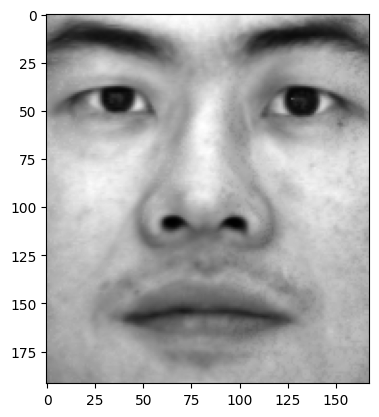

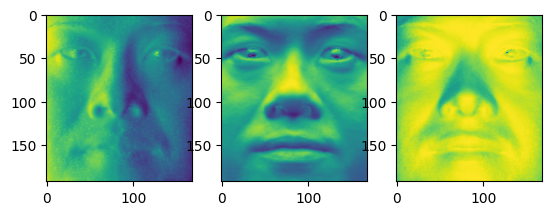

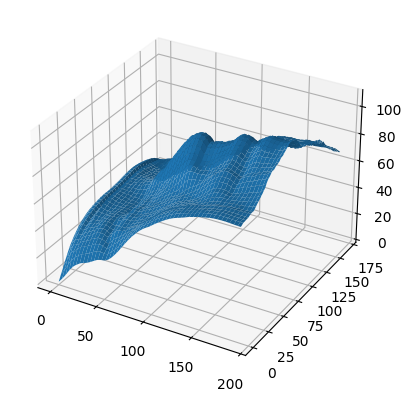

row path type:
Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Max SE error: 18.118283380367767
Number of outliers: 538

(192, 168)


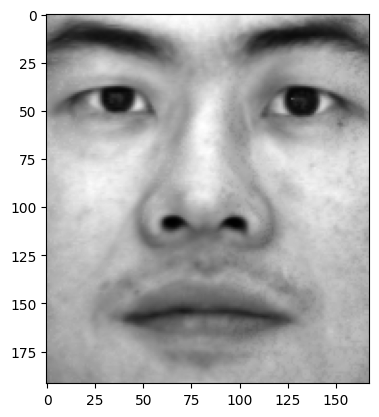

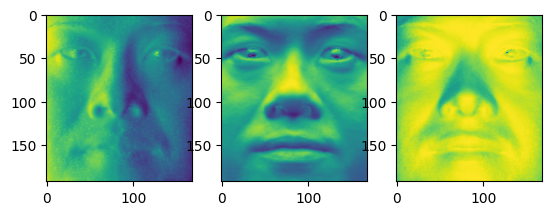

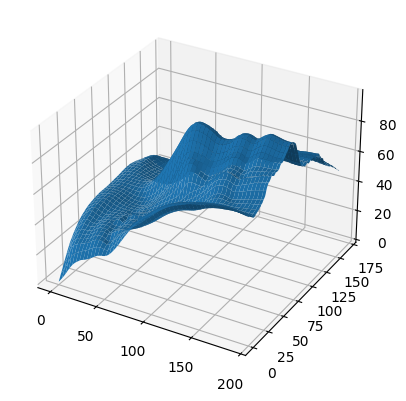

column path type:
Finish loading 64 images.

Computing surface albedo and normal map...

Integrability checking
Max SE error: 18.118283380367725
Number of outliers: 538

(192, 168)


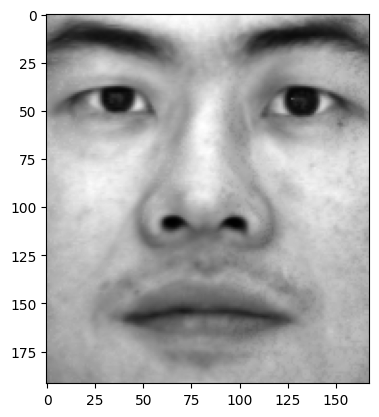

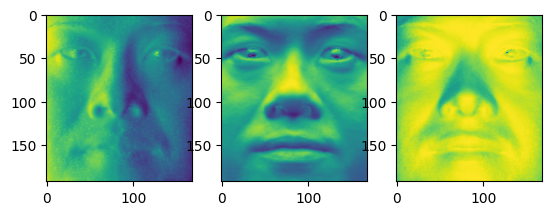

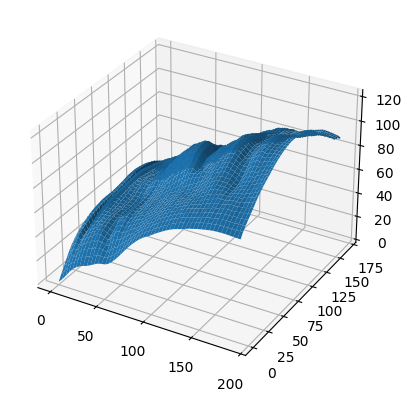

In [525]:
print("average path type:")
photometric_stereo_face(path_type='average')
print('row path type:')
photometric_stereo_face(path_type='row')
print("column path type:")
photometric_stereo_face(path_type='column')

When using the column path type, the height map is a bit more flattened and stretched out. When using the row path type, the oppposite happens, the height differences are bigger. If you then use the average path type, these differences average out and you obtain a height map with normal shapes, like you would expect.

##### 3.c Discuss how the images violate the assumptions of the shape-from-shading methods. Remember to include specific input images to illustrate your points.


The assumptions of the shape-from-shading methods are that the surface under consideration is of a uniform albedo and reflectance and that the light source direction is known or can be calibrated. The light source direction is known in these images, however, the albedo and reflectance aren't the same for all images. For example, the images yaleB02_P00A+020E-10.pgm and yaleB02_P00A+025E+00.pgm (top image) contain stripes, which isn't consistent with the albedo of the other images. Also, the facial expression and reflectance are slightly different in for example images yaleB02_P00A+035E+65.pgm (bottom image), yaleB02_P00A+000E+45.pgm and yaleB02_P00A+070E+45.pgm.

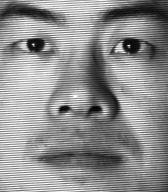

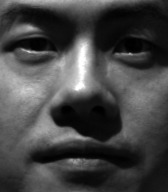

##### 3.d How would the results improve when the problematic images are all removed? Try it out and show the results in your notebook.

In the new result, the albedo and the surface normals should be more similar to the true albedo. In the result below, one can indeed see some small differences, for example under the eyes. Also, the SE error should be lower than in the first result. This is the case, the max error before filtering images when using a column integration path was 15.46, and this error now is 12.88.
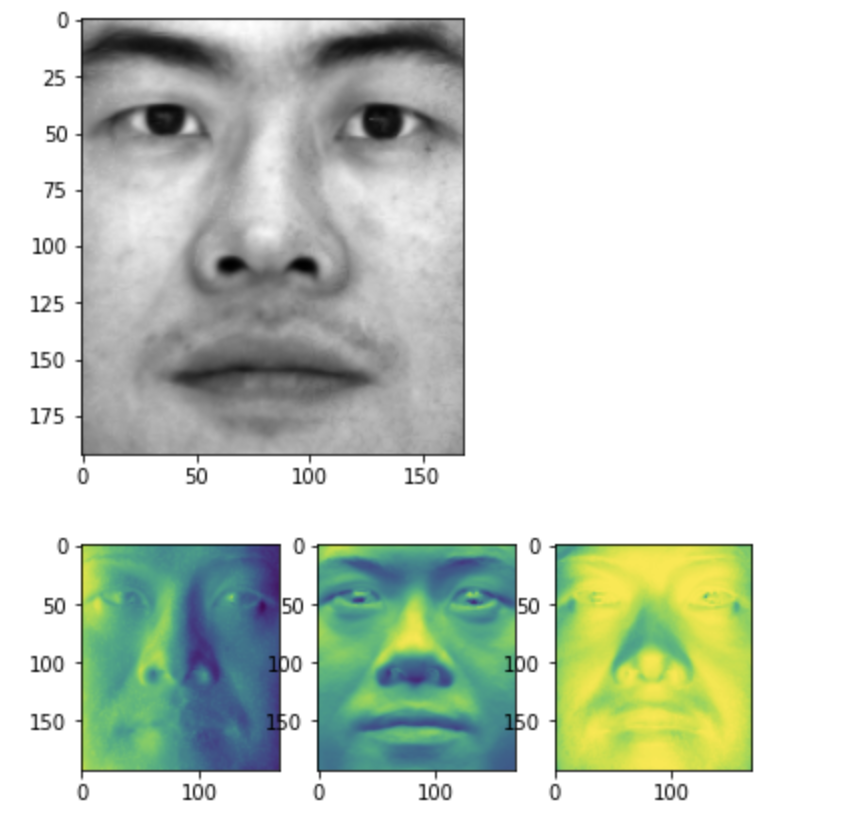

#### 4.4.4. Real world dataset B (5 pts).  

And finally, the Apple dataset. Show your results on real-world 3-channel RGB inputs, contained in the "Apple" folder.

Observe and discuss the results for different integration paths. You may find difficulties in using this non-sythetic dataset. Try if filtering may help.

Loading images...

Computing surface albedo and normal map...

Integrability checking
SE: (696, 646) 7585447723.027955
Number of outliers: 85660



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(696, 646, 3)


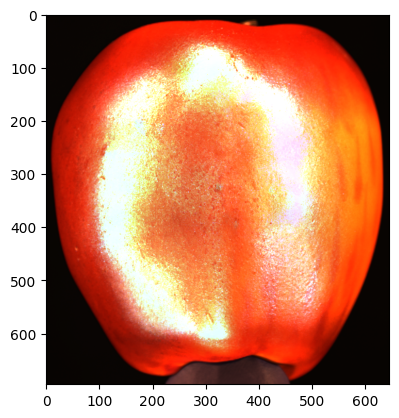

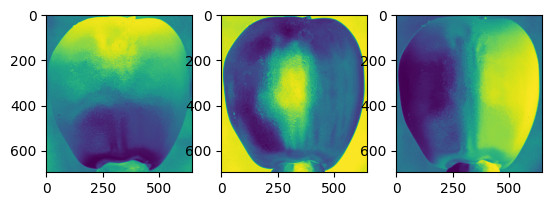

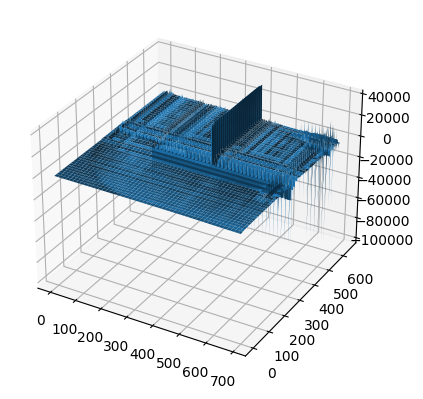

Loading images...

Computing surface albedo and normal map...

Integrability checking
SE: (696, 646) 7585447722.086588
Number of outliers: 85660



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(696, 646, 3)


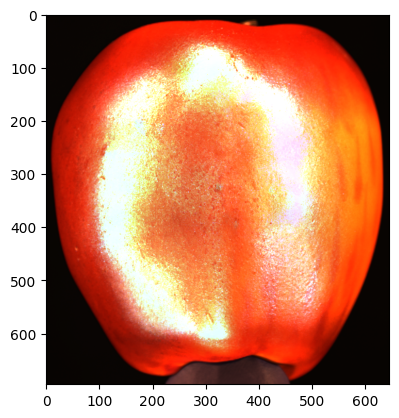

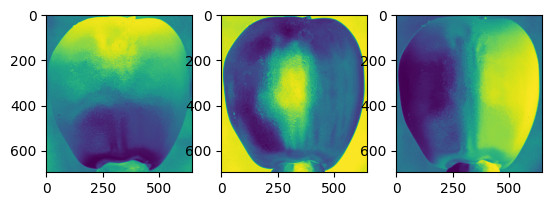

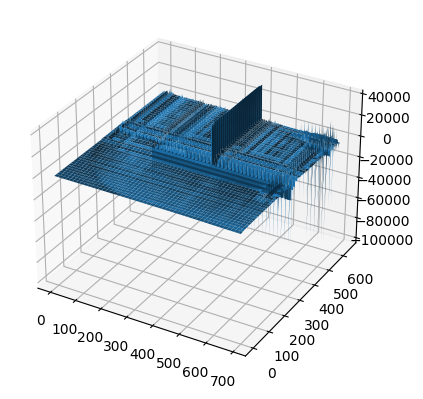

Loading images...

Computing surface albedo and normal map...

Integrability checking
SE: (696, 646) 7585447722.518238
Number of outliers: 85660



Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(696, 646, 3)


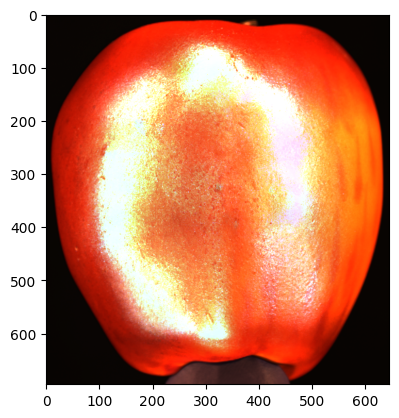

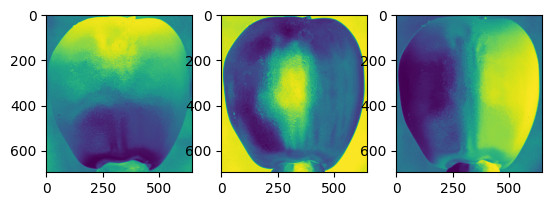

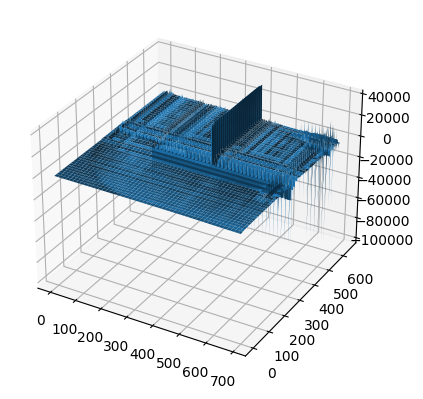

In [526]:
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type="average")
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type="row")
photometric_stereo_apple(image_dir='./images/photometrics_images/Apple/', path_type="column")

The results of the filtering are shown below. For all integration paths, the results are very bad. This is due to the blobs of light reflection that the apple contains. These blobs are on different places depending on the shadow, which causes a lot of noise in general. Filtering the images was tried, but even removing 32 images where these blobs were the most intense did not make much of a difference. The albedo image is better than with the original image dataset, one can see that the light reflectance is decreased.

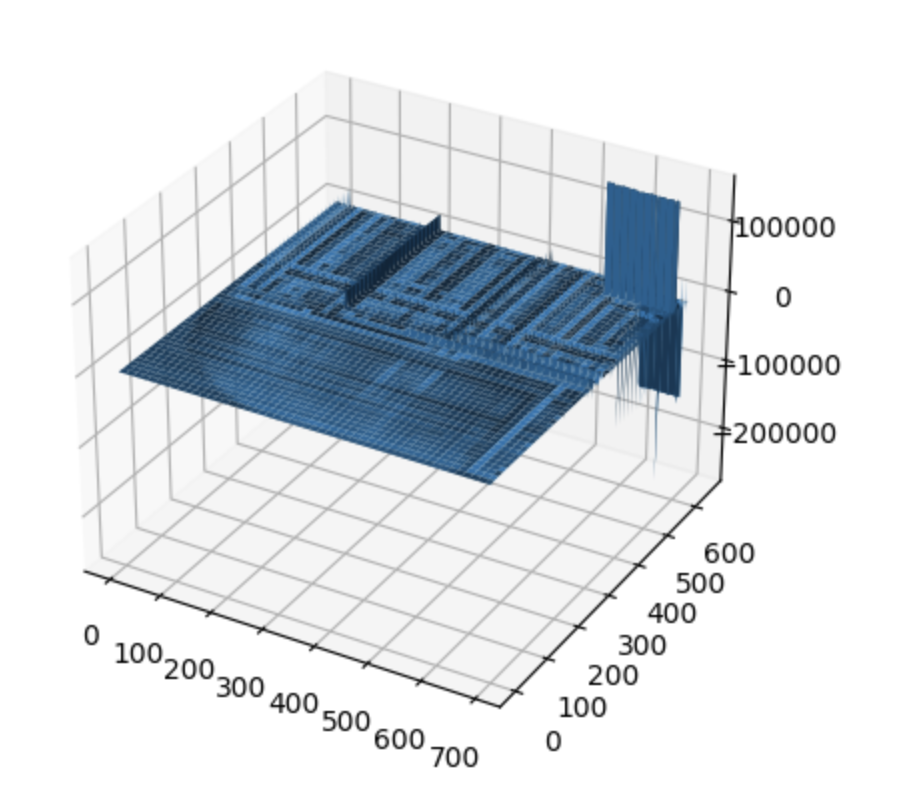

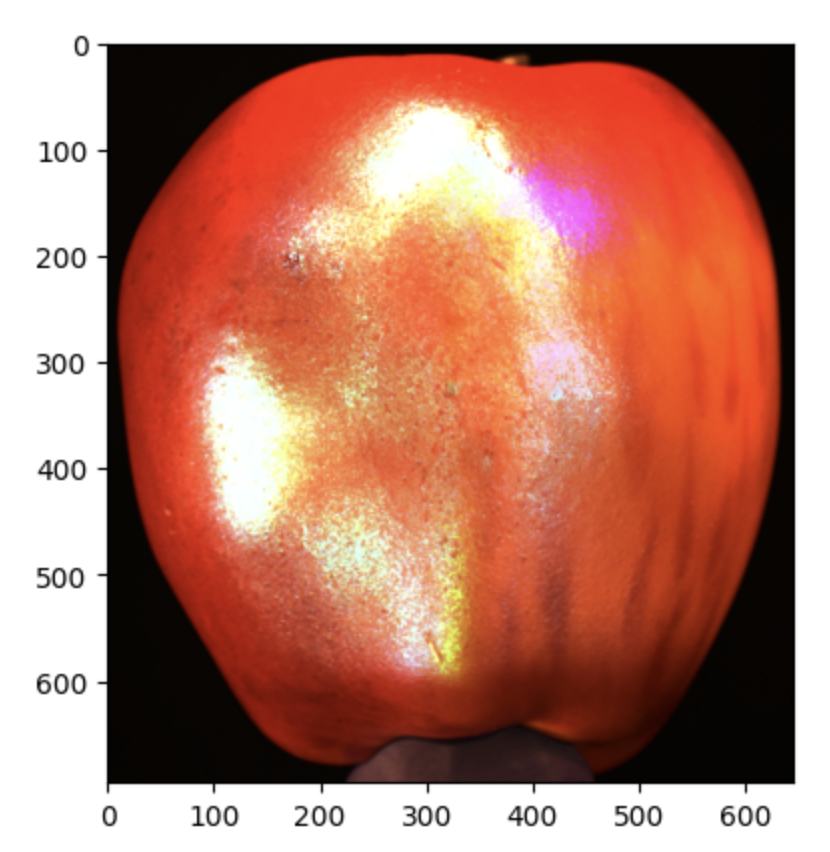

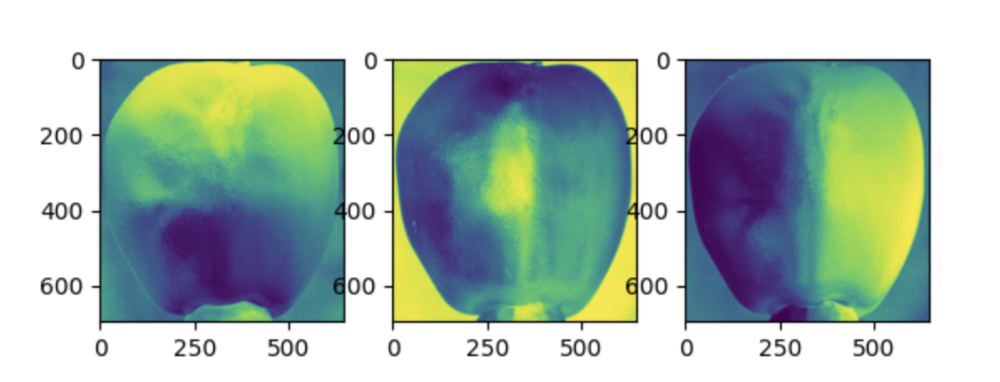

# X Individual Contribution Report *(Mandatory)*

Because we want each student to contribute fairly to the submitted work, we ask you to fill out the textcells below. Write down your contribution to each of the assignment components in percentages. Naturally, percentages for one particular component should add up to 100% (e.g. 30% - 30% - 40%). No further explanation has to be given.


Name: Karim Abdel Sadek

Contribution on research: 50\
Contribution on programming: 50\
Contribution on writing: 50

Name: Macha Meijer

Contribution on research: 50\
Contribution on programming: 50 \
Contribution on writing: 50

# -End of Notebook-